# Preamble

In [1]:
%load_ext autoreload

In [2]:
import os as _os
_os.chdir(_os.environ['PROJECT_ROOT'])
_os.path.realpath(_os.path.curdir)

'/pollard/home/bsmith/Projects/strain-corr'

In [514]:
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
import xarray as xr
from lib.pandas_util import idxwhere, align_indexes, invert_mapping
import matplotlib as mpl
import lib.plot
import statsmodels as sm
from statsmodels.stats.multitest import fdrcorrection
from tqdm import tqdm
import subprocess
from tempfile import mkstemp
import time
import subprocess
from itertools import chain, product, combinations
from umap import UMAP

In [4]:
import sfacts as sf

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [111]:
sns.set_context('talk')
plt.rcParams['figure.dpi'] = 250

In [5]:
# sns.set_context('talk')
# plt.rcParams['figure.dpi'] = 100
stemA = 'hmp2.a.r.proc'
centroid = 75
stemB = 'filt-poly05-cvrg05.ss-g10000-block0-seed0.fit-sfacts37-s80-seed0'
# stemB = 'filt-poly05-cvrg05.ss-g10000-block0-seed0.approx-clust2-thresh05-s95'

# Analysis Parameters

In [6]:
species_id = '102506'
# depth_ratio_bound = 3
# species_gene_corr_thresh = 0.99
# n_species_genes = 2000
species_gene_corr_thresh = 0.98

# Prepare Data

## Taxonomy

In [7]:
species_taxonomy = pd.read_table('ref/gtpro/species_taxonomy_ext.tsv', names=['genome_id', 'species_id', 'taxonomy_string']).assign(species_id=lambda x: x.species_id.astype(str)).set_index('species_id')[['taxonomy_string']].assign(taxonomy_split=lambda x: x.taxonomy_string.str.split(';'))

for level_name, level_number in [('p__', 1), ('c__', 2), ('o__', 3), ('f__', 4), ('g__', 5), ('s__', 6)]:
    species_taxonomy = species_taxonomy.assign(**{level_name: species_taxonomy.taxonomy_split.apply(lambda x: x[level_number])}) 
species_taxonomy = species_taxonomy.drop(columns=['taxonomy_split'])

species_taxonomy.loc[species_id]

taxonomy_string    d__Bacteria;p__Proteobacteria;c__Gammaproteoba...
p__                                                p__Proteobacteria
c__                                           c__Gammaproteobacteria
o__                                              o__Enterobacterales
f__                                            f__Enterobacteriaceae
g__                                                   g__Escherichia
s__                                                              s__
Name: 102506, dtype: object

In [8]:
midasdb_genomes = pd.read_table('ref_temp/uhgg_genomes_all_4644.tsv')

In [9]:
midasdb_genomes.Species_rep.value_counts()

GUT_GENOME144544    8288
GUT_GENOME143712    7507
GUT_GENOME096083    5983
GUT_GENOME143505    5750
GUT_GENOME095971    5042
                    ... 
GUT_GENOME141102       1
GUT_GENOME141101       1
GUT_GENOME141041       1
GUT_GENOME006201       1
GUT_GENOME286625       1
Name: Species_rep, Length: 4644, dtype: int64

3.0 2.0 14.0


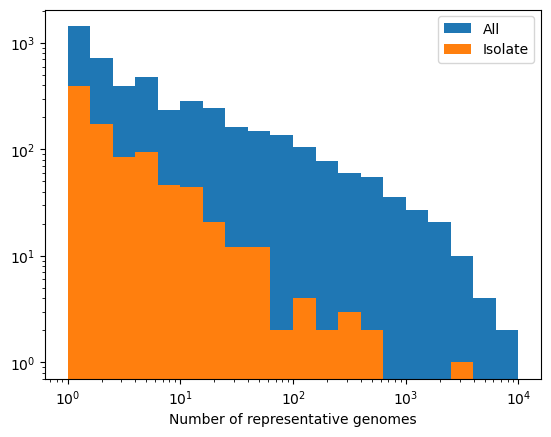

In [10]:
d0 = midasdb_genomes.Species_rep.value_counts()
d1 = midasdb_genomes[lambda x: x.Genome_type == 'Isolate'].Species_rep.value_counts()
bins = np.logspace(0, np.log10(10000), num=21)


plt.hist(d0.values, bins=bins, label='All')
plt.hist(d1.values, bins=bins, label='Isolate')

plt.yscale('log')
plt.xscale('log')
plt.legend()

plt.xlabel('Number of representative genomes')
print(d0.median(), d1.median(), d0.quantile(0.75))
None

,ftype,length_bp,gene,ec_number,cog,product
locus_tag,,,,,,
UHGG141776_00944,CDS,429,NaN,NaN,NaN,hypothetical protein
UHGG026556_00093,CDS,219,rpiB_1,5.3.1.6,COG0698,Ribose-5-phosphate isomerase B
UHGG026556_00767,CDS,870,murQ,4.2.1.126,COG2103,N-acetylmuramic acid 6-phosphate etherase
UHGG026556_01044,CDS,498,NaN,NaN,NaN,hypothetical protein
UHGG026556_01504,CDS,414,NaN,NaN,NaN,hypothetical protein
...,...,...,...,...,...,...
UHGG142608_02839,CDS,153,NaN,NaN,NaN,hypothetical protein
UHGG142608_02934,CDS,960,pgrR_2,NaN,NaN,HTH-type transcriptional regulator PgrR
UHGG142608_03146,CDS,243,NaN,NaN,NaN,hypothetical protein


3.0 2.0 14.0


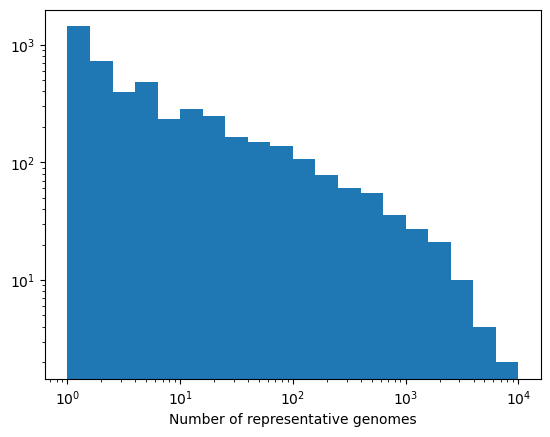

In [11]:
d0 = midasdb_genomes.Species_rep.value_counts()
d1 = midasdb_genomes[lambda x: x.Genome_type == 'Isolate'].Species_rep.value_counts()
bins = np.logspace(0, np.log10(10000), num=21)


plt.hist(d0.values, bins=bins, label='All')
# plt.hist(d1.values, bins=bins, label='Isolate')

plt.yscale('log')
plt.xscale('log')
# plt.legend()

plt.xlabel('Number of representative genomes')
print(d0.median(), d1.median(), d0.quantile(0.75))
None

## Species

In [12]:
all_species_depth = pd.read_table(f'data/{stemA}.gtpro.species_depth.tsv', index_col=['sample', 'species_id']).squeeze().unstack('species_id', fill_value=0).rename(str, axis='columns')
species_rabund = all_species_depth.divide(all_species_depth.sum(1), axis=0)

0.14705882352941177


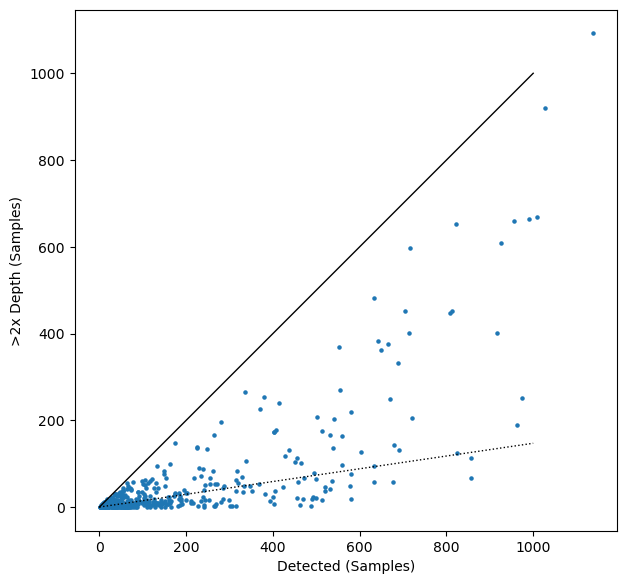

In [13]:
x = (species_rabund > 0.0001).sum(0)
y = (all_species_depth > 2).sum(0)

median_ratio = (y / x).median()
print(median_ratio)

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(x, y, s=5)
# ax.plot([0, 1e4], [0, 1e4], c='k', lw=2, linestyle=':')
# ax.plot([0, 5e3], [0, 5e3], c='k', lw=1, linestyle=':')

plt.plot([0, 1e3], [0, 1e3], c='k', lw=1)
plt.plot([0, 1e3], [0, 1e3 * median_ratio], c='k', lw=1, linestyle=':')


# ax.set_yscale('log')
# ax.set_xscale('log')
ax.set_ylabel('>2x Depth (Samples)')
ax.set_xlabel('Detected (Samples)')

# ax.set_ylim(1, 3e3)
# ax.set_xlim(1, 3e3)
ax.set_aspect(1)

In [14]:
species_id_to_species_rep = pd.read_table('ref_temp/uhgg_genomes_all_4644.tsv')[['Species_rep', 'MGnify_accession']].drop_duplicates().assign(species_id=lambda x: '1' + x.MGnify_accession.str[len('MGYG-HGUT-'):]).rename(columns={'Species_rep': 'species_rep'}).set_index('species_id').species_rep
species_rep_to_species_id = lib.pandas_util.invert_mapping(species_id_to_species_rep)

Text(0.5, 0, 'Detected (Samples)')

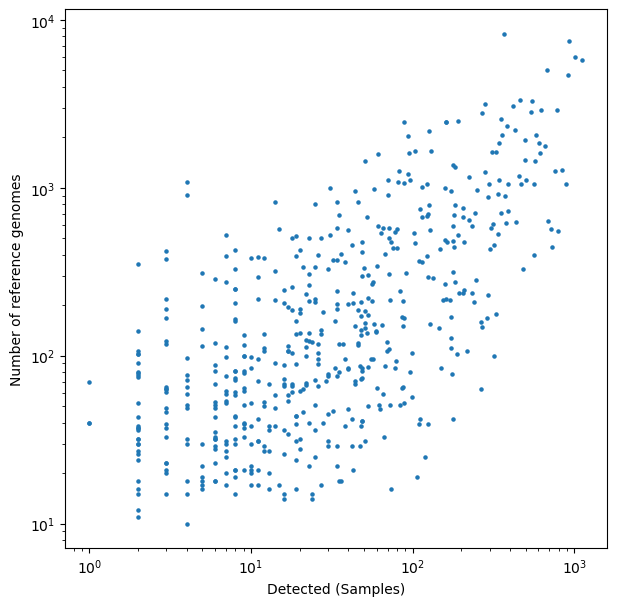

In [15]:
x = (species_rabund > 0.001).sum(0)

y1 = midasdb_genomes.Species_rep.value_counts().rename(species_rep_to_species_id).loc[x.index]
y2 = midasdb_genomes[lambda x: x.Genome_type == 'Isolate'].Species_rep.value_counts().rename(species_rep_to_species_id).reindex(x.index, fill_value=0)


fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(x, y1, s=5)
# ax.plot([0, 1e4], [0, 1e4], c='k', lw=2, linestyle=':')
# ax.plot([0, 5e3], [0, 5e3], c='k', lw=1, linestyle=':')

# plt.plot([0, 1e3], [0, 1e3], c='k', lw=1)
# plt.plot([0, 1e3], [0, 1e3 * median_ratio], c='k', lw=1, linestyle=':')


ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Number of reference genomes')
ax.set_xlabel('Detected (Samples)')

# ax.set_ylim(1, 3e3)
# ax.set_xlim(1, 3e3)
# ax.set_aspect(1)

Text(0.5, 0, 'Mean rabund')

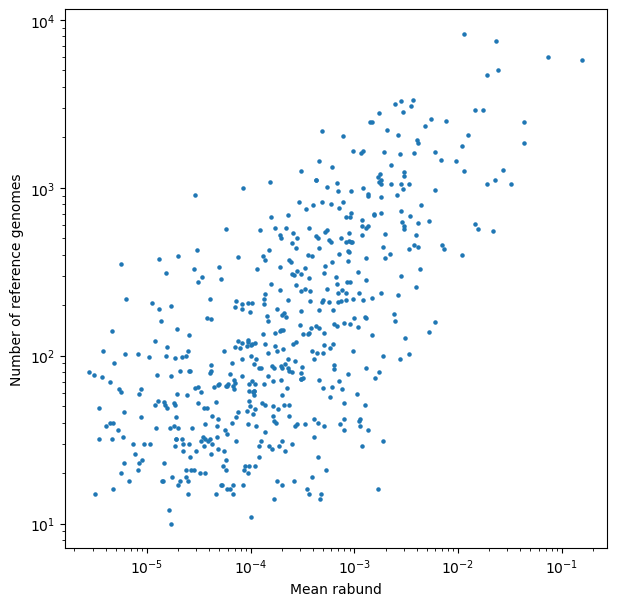

In [16]:
x = species_rabund.mean(0)

y1 = midasdb_genomes.Species_rep.value_counts().rename(species_rep_to_species_id).loc[x.index]
y2 = midasdb_genomes[lambda x: x.Genome_type == 'Isolate'].Species_rep.value_counts().rename(species_rep_to_species_id).reindex(x.index, fill_value=0)


fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(x, y1, s=5)
# ax.plot([0, 1e4], [0, 1e4], c='k', lw=2, linestyle=':')
# ax.plot([0, 5e3], [0, 5e3], c='k', lw=1, linestyle=':')

# plt.plot([0, 1e3], [0, 1e3], c='k', lw=1)
# plt.plot([0, 1e3], [0, 1e3 * median_ratio], c='k', lw=1, linestyle=':')


ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Number of reference genomes')
ax.set_xlabel('Mean rabund')

# ax.set_ylim(1, 3e3)
# ax.set_xlim(1, 3e3)
# ax.set_aspect(1)

0.2894736842105263


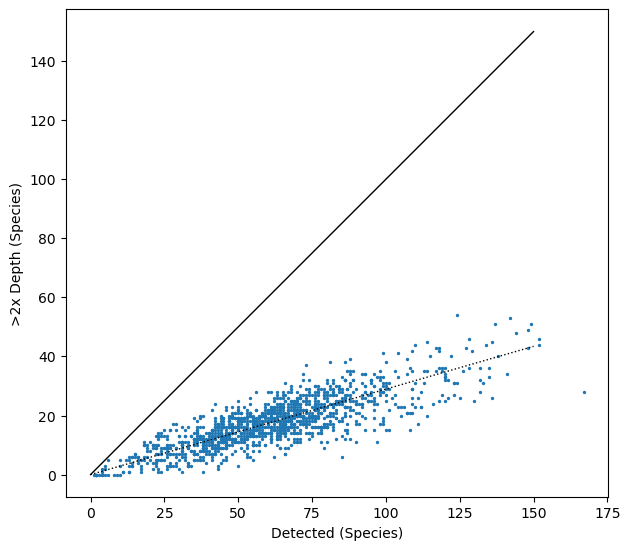

In [17]:
x = (species_rabund > 0.0001).sum(1)
y = (all_species_depth > 2).sum(1)

median_ratio = (y / x).median()
print(median_ratio)

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(x, y, s=2)
# ax.plot([0, 1e4], [0, 1e4], c='k', lw=2, linestyle=':')
# ax.plot([0, 5e3], [0, 5e3], c='k', lw=1, linestyle=':')

plt.plot([0, 150], [0, 150], c='k', lw=1)
plt.plot([0, 150], [0, 150 * median_ratio], c='k', lw=1, linestyle=':')

# ax.set_yscale('log')
# ax.set_xscale('log')
ax.set_ylabel('>2x Depth (Species)')
ax.set_xlabel('Detected (Species)')

# ax.set_ylim(1, 3e3)
# ax.set_xlim(1, 3e3)
ax.set_aspect(1)

1.0670999709676137


Text(0.5, 0, 'Detected (Samples)')

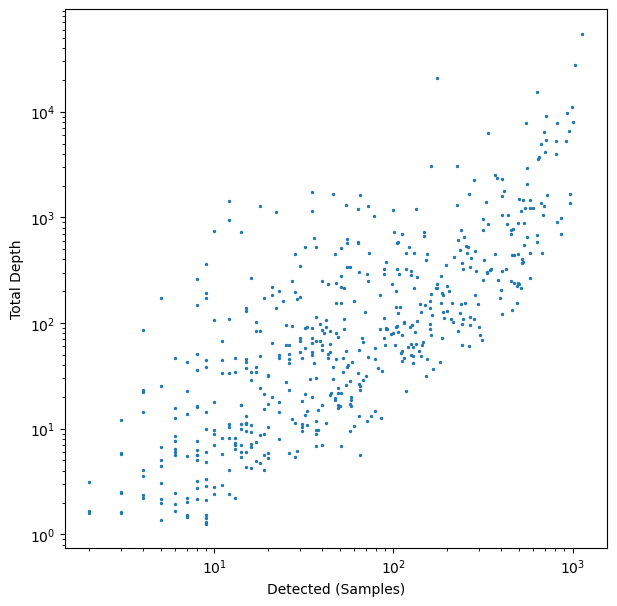

In [18]:
x = (species_rabund > 0.0001).sum(0)
y = (all_species_depth).sum(0)

median_ratio = (y / x).median()
print(median_ratio)

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(x, y, s=2)
# ax.plot([0, 1e4], [0, 1e4], c='k', lw=2, linestyle=':')
# ax.plot([0, 5e3], [0, 5e3], c='k', lw=1, linestyle=':')

ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel('Total Depth')
ax.set_xlabel('Detected (Samples)')

# ax.set_ylim(1, 3e3)
# ax.set_xlim(1, 3e3)
# ax.set_aspect(1)

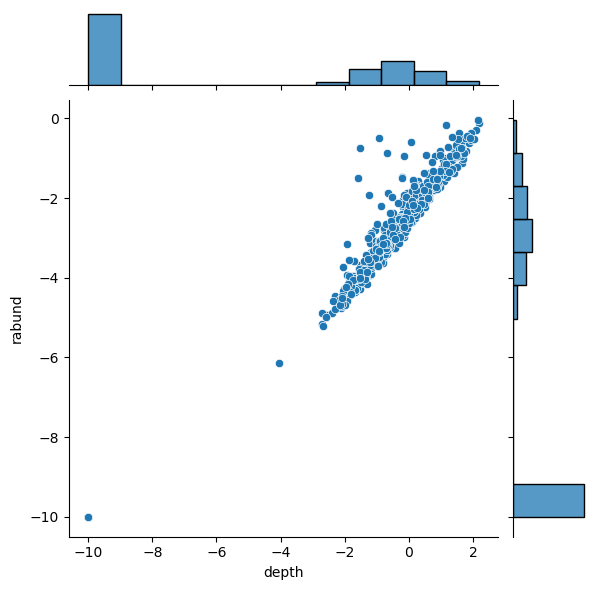

In [19]:
d = pd.DataFrame(dict(depth=np.log10(all_species_depth[species_id] + 1e-10), rabund=np.log10(species_rabund[species_id] + 1e-10)))

sns.jointplot(x='depth', y='rabund', data=d)

In [20]:
gtpro_species_depth = pd.read_table(f'data/sp-{species_id}.{stemA}.gtpro.species_depth.tsv', dtype=dict(sample=str, species_id=str, depth=float), index_col=['sample', 'species_id']).squeeze().unstack('species_id')

In [21]:
species_depth = pd.read_table(f'data_temp/sp-{species_id}.{stemA}.midas_gene{centroid}.species_depth.tsv', names=['sample', 'depth'], index_col='sample').squeeze()

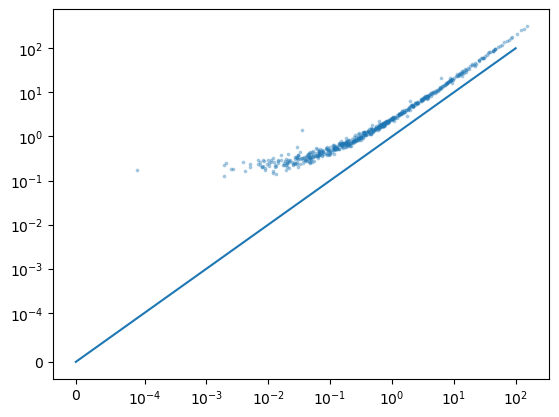

In [22]:
d = pd.DataFrame(dict(gtpro=gtpro_species_depth[species_id], midas=species_depth))

plt.scatter('gtpro', 'midas', data=d, s=3, alpha=0.3)
plt.plot([0, 1e2], [0, 1e2])
plt.yscale('symlog', linthresh=1e-4)
plt.xscale('symlog', linthresh=1e-4)

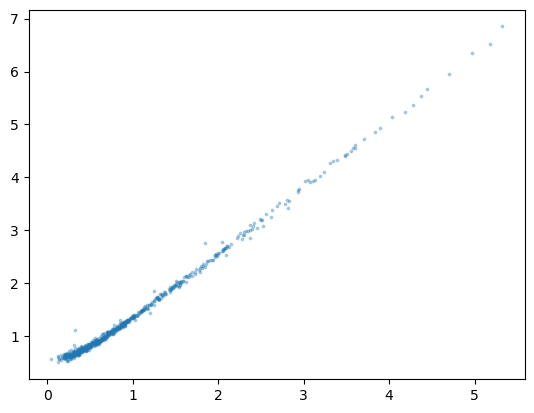

In [23]:
d = pd.DataFrame(dict(gtpro=gtpro_species_depth[species_id], midas=species_depth))

plt.scatter('gtpro', 'midas', data=np.cbrt(d), s=3, alpha=0.3)
# plt.plot([0, 1e2], [0, 1e2])
# plt.yscale('symlog', linthresh=1e-4)
# plt.xscale('symlog', linthresh=1e-4)

In [24]:
species_corr = pd.read_table(f'data_temp/sp-{species_id}.{stemA}.midas_gene{centroid}.species_correlation.tsv', names=['sample', 'correlation'], index_col='sample').squeeze()

## Metadata

In [25]:
mgen = pd.read_table('meta/hmp2/mgen.tsv', index_col='library_id')
preparation = pd.read_table('meta/hmp2/preparation.tsv', index_col='preparation_id')
stool = pd.read_table('meta/hmp2/stool.tsv', index_col='stool_id')

sample_meta = mgen.join(preparation, on='preparation_id', rsuffix='_').join(stool, on='stool_id').loc[all_species_depth.index]

In [26]:
len(sample_meta.stool_id.unique()), len(sample_meta.subject_id.unique())

(1305, 106)

## Strains

In [27]:
fit = sf.World.load(
    f'data_temp/sp-{species_id}.{stemA}.gtpro.{stemB}.world.nc'
).drop_low_abundance_strains(0.05)
print(fit.sizes)

np.random.seed(0)
fit_ss = fit.random_sample(position=min(fit.sizes['position'], 500))

Frozen({'strain': 136, 'position': 10000, 'sample': 624, 'allele': 2})


In [28]:
strain_corr = pd.read_table(
    f'data_temp/sp-{species_id}.{stemA}.gtpro.{stemB}.midas_gene{centroid}.strain_correlation.tsv',
    index_col=['gene_id', 'strain']
).squeeze().unstack(fill_value=0)
# strain_corr = strain_by_species_corr.sel(species_id=species_id).to_series().unstack('strain')
strain_depth = pd.read_table(
    f'data_temp/sp-{species_id}.{stemA}.gtpro.{stemB}.midas_gene{centroid}.strain_depth_ratio.tsv',
    index_col=['gene_id', 'strain']
).squeeze().unstack()
strain_corr, strain_depth = align_indexes(*align_indexes(strain_corr, strain_depth), axis="columns")

In [29]:
sample_to_strain = (
    (fit.community.data > 0.95)
    .to_series()
    .unstack()
    .apply(idxwhere, axis=1)
    [lambda x: x.apply(bool)]
    .str[0]
    .rename('strain')
)
    
strain_to_sample_list = (
    sample_to_strain
    .rename('strain_id')
    .reset_index()
    .groupby('strain_id')
    .apply(lambda x: x['sample'].to_list())
)
strain_to_sample_list.apply(len).sort_values(ascending=False).head()

strain_id
8     78
34    16
22    15
7     15
36    11
dtype: int64

In [30]:
# species_gene_corr_thresh = species_corr.sort_values(ascending=False).head(n_species_genes + 1).min()
species_gene_list = idxwhere(species_corr.loc[strain_corr.index] > species_gene_corr_thresh)
print(len(species_gene_list))

566


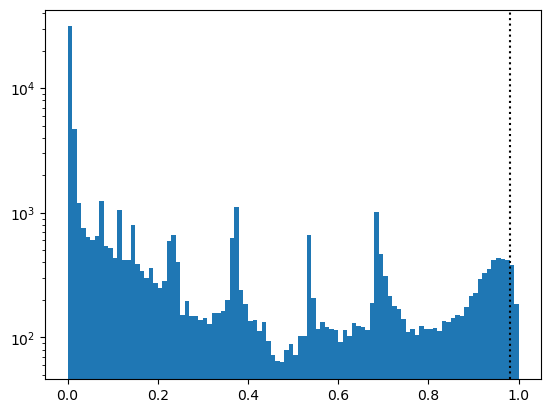

In [31]:
# strain_thresh = pd.read_table(
#     f'data_temp/sp-{species_id}.{stemA}.gtpro.{stemB}.midas_gene{centroid}.strain_correlation_threshold.tsv',
#     names=['strain_id', 'threshold'],
#     index_col='strain_id',
# ).loc[strain_corr.columns]
plt.hist(species_corr, bins=np.linspace(0, 1, num=101))
plt.axvline(species_gene_corr_thresh, linestyle=':', color='k')
plt.yscale('log')

In [32]:
gene_depth = xr.load_dataarray(f'data_temp/sp-{species_id}.{stemA}.midas_gene{centroid}.depth.nc').sel(sample=species_depth.index)

In [33]:
x = gene_depth.sel(sample=species_depth.index)
y = species_depth

global_species_gene_depth = x.sum("sample") / species_depth.sum()

3.7916493969650475 0.10928152322172884


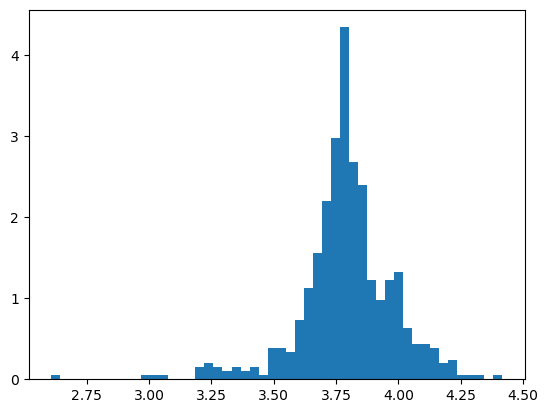

In [34]:
x = np.log10(gene_depth.sel(gene_id=species_gene_list).sum("sample"))
loc_hat, scale_hat = sp.stats.t.fit_loc_scale(x, 3)

plt.hist(x, bins=50, density=True)
print(loc_hat, scale_hat)
None

In [35]:
strain_frac = pd.read_table(f'data_temp/sp-{species_id}.{stemA}.gtpro.{stemB}.comm.tsv', index_col=['sample', 'strain']).squeeze().unstack(fill_value=0)

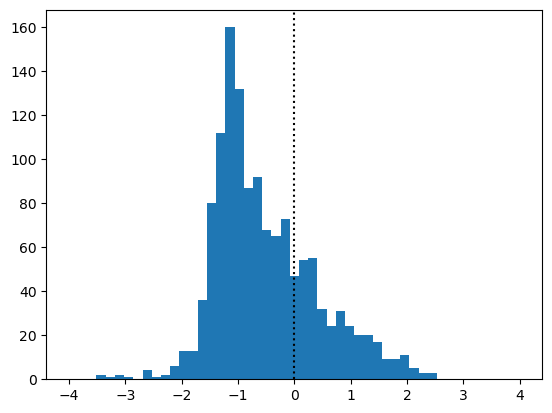

In [36]:
plt.hist(np.log10(species_depth[species_depth > 0]), bins=np.linspace(-4, 4))
plt.axvline(np.log10(1.0), linestyle=':', color='k')

In [37]:
mgen.sequenced_reads.quantile([0.25, 0.5, 0.75])

0.25    12562372.75
0.50    15989118.50
0.75    19527682.25
Name: sequenced_reads, dtype: float64

## MIDAS Genes, COGs COG categories

In [38]:
gene_cluster = pd.read_table(
    f'ref_temp/midasdb_uhgg/pangenomes/{species_id}/cluster_info.txt'
).set_index('centroid_99', drop=False).rename_axis(index='gene_id')
gene_annotation = pd.read_table(
    f'ref_temp/midasdb_uhgg.sp-{species_id}.gene{centroid}_annotations.tsv',
    names=['locus_tag', 'ftype', 'length_bp', 'gene', 'EC_number', 'COG', 'product'],
    index_col='locus_tag',
).rename(columns=str.lower)

gene_meta = gene_cluster.loc[gene_cluster[f'centroid_{centroid}'].unique()].join(gene_annotation)

In [483]:
midasdb_uhgg_meta = pd.read_table('ref_temp/midasdb_uhgg.metadata.tsv')

In [39]:
_cog_meta = pd.read_table(
    'ref/cog-20.meta.tsv',
    names=['cog', 'categories', 'description', 'gene', 'pathway', '_1', '_2'],
    index_col=['cog']
)
cog_meta = _cog_meta.drop(columns=['categories', '_1', '_2'])
cog_x_category = _cog_meta.categories.apply(tuple).apply(pd.Series).unstack().to_frame(name='category').reset_index()[['cog', 'category']].dropna()

In [40]:
cog_category = pd.read_table('ref/cog-20.categories.tsv', names=['category', 'description'], index_col='category')

## Genes

In [41]:
sample_depth = xr.load_dataarray(f'data_temp/sp-{species_id}.{stemA}.midas_gene{centroid}.depth.nc')

## References

In [42]:
reference_meta = pd.read_table('ref_temp/uhgg_genomes_all_4644.tsv', index_col='Genome').rename_axis(index='genome_id')[lambda x: x.MGnify_accession == 'MGYG-HGUT-' + species_id[1:]].rename(lambda s: 'UHGG' + s[10:])
reference_meta.head()

,Genome_type,Length,N_contigs,N50,GC_content,Completeness,Contamination,Species_rep,MGnify_accession,Lineage,Continent
genome_id,,,,,,,,,,,
UHGG000026,Isolate,5095388,44,245104,50.56,99.72,0.08,GUT_GENOME144544,MGYG-HGUT-02506,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Europe
UHGG000027,Isolate,4998207,106,103519,50.65,99.03,0.30,GUT_GENOME144544,MGYG-HGUT-02506,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Europe
UHGG000036,Isolate,4978086,124,99332,50.65,99.27,0.35,GUT_GENOME144544,MGYG-HGUT-02506,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Europe
UHGG000309,Isolate,4682102,42,653581,50.65,99.97,0.93,GUT_GENOME144544,MGYG-HGUT-02506,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,North America
UHGG000316,Isolate,5046484,66,244235,50.51,99.67,0.04,GUT_GENOME144544,MGYG-HGUT-02506,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,Europe


In [43]:
reference_gene = xr.load_dataarray(f'data_temp/sp-{species_id}.midas_gene{centroid}.reference_copy_number.nc')
reference_gene = pd.DataFrame(reference_gene.T.values, index=reference_gene.gene_id, columns=reference_gene.genome_id)

In [44]:
isolate_gene = reference_gene[idxwhere(reference_meta.Genome_type == 'Isolate')]

# QC Strains

In [45]:
strain_thresholds = (
    pd.read_table(f'data_temp/sp-{species_id}.{stemA}.gtpro.{stemB}.midas_gene{centroid}.strain_gene_threshold.tsv', index_col='strain')
    .rename(columns=dict(
        correlation_strict='corr_threshold_strict',
        correlation_moderate='corr_threshold_moderate',
        correlation_lenient='corr_threshold_lenient',
        depth_high='depth_thresh_high',
        depth_low='depth_thresh_low',
    ))
)

In [46]:
_strain_meta = (
    strain_thresholds
    .join(fit.genotype.entropy().to_series().rename('genotype_entropy'))
    .join(fit.metagenotype.entropy().to_series().rename('metagenotype_entropy').groupby(sample_to_strain).mean().rename(int))
    .join(strain_to_sample_list.apply(len).rename('num_samples'))
    .join(species_depth.apply(np.cbrt).groupby(sample_to_strain).std().rename('depth_stdev').rename(int))
    .join(species_depth.apply(np.cbrt).groupby(sample_to_strain).max().rename('depth_max').rename(int))
    .join(species_depth.apply(np.cbrt).groupby(sample_to_strain).sum().rename('depth_sum').rename(int))
    .assign(power_index=lambda x: (x.depth_stdev * np.sqrt(x.num_samples)).fillna(0))
)
strain_meta = _strain_meta
high_power_strain_list = idxwhere((strain_meta.power_index > 1.0) & (strain_meta.metagenotype_entropy < 0.05))
print(len(high_power_strain_list))
highest_power_strain_list = strain_meta.sort_values('power_index', ascending=False).head(3).index
strain_meta.sort_values('num_samples', ascending=False)

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/xarray/core/computation.py:771: RuntimeWarning: divide by zero encountered in log2
  result_data = func(*input_data)


16


,corr_threshold_strict,corr_threshold_moderate,corr_threshold_lenient,depth_thresh_low,depth_thresh_high,genotype_entropy,metagenotype_entropy,num_samples,depth_stdev,depth_max,depth_sum,power_index
strain,,,,,,,,,,,,
8,0.979613,0.967908,0.914441,0.542215,1.922449,0.058286,0.002158,78,0.963933,5.672279,99.327870,8.513228
34,0.778813,0.667864,0.196200,0.480272,2.070389,0.124003,0.001017,16,0.519467,2.321125,17.745944,2.077869
22,0.993995,0.973642,0.782956,0.496985,2.029359,0.095271,0.001336,15,0.609751,2.882755,17.226329,2.361557
7,0.970136,0.865873,0.121738,0.448453,2.045397,0.137511,0.003036,15,0.405085,2.362697,17.114460,1.568889
36,0.999445,0.998885,0.997307,0.517724,1.751996,0.057694,0.001486,11,1.212358,6.851659,40.893615,4.020937
3,0.771826,0.720718,0.578369,0.533937,1.982550,0.175274,0.015242,10,0.828880,2.681343,15.703293,2.621150
85,0.778212,0.686151,0.102301,0.480530,1.949413,0.144607,0.010447,10,0.505457,2.157147,13.392359,1.598395
39,0.160709,0.122518,0.032313,0.318596,3.223966,0.186887,0.000937,10,0.320273,1.582000,10.074094,1.012792
27,0.926792,0.891131,0.756649,0.503473,1.881499,0.127603,0.017579,9,1.549563,4.402050,20.008324,4.648689


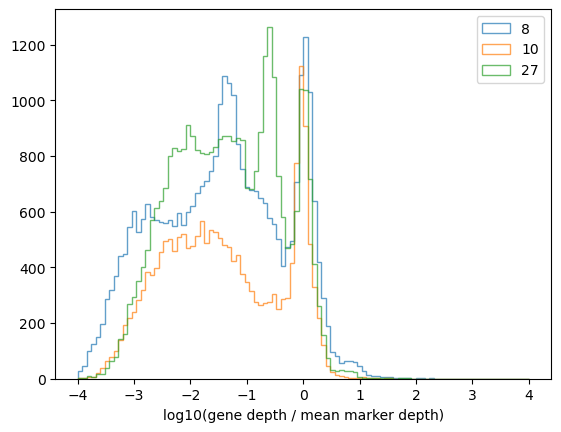

In [47]:
bins = np.linspace(-4, 4, num=101)

for strain in highest_power_strain_list:
    plt.hist(np.log10(strain_depth[strain][lambda x: x > 0]), bins=bins, alpha=0.7, histtype='step', label=strain) 
plt.legend()
plt.xlabel('log10(gene depth / mean marker depth)')

None

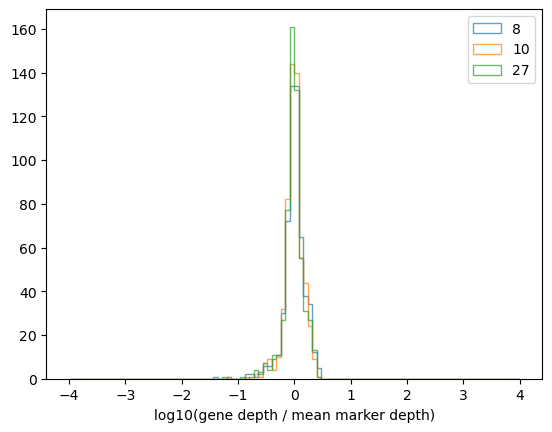

In [48]:
bins = np.linspace(-4, 4, num=101)

for strain in highest_power_strain_list:
    plt.hist(np.log10(strain_depth[strain][species_gene_list][lambda x: x > 0]), bins=bins, alpha=0.7, histtype='step', label=strain)
plt.legend()
plt.xlabel('log10(gene depth / mean marker depth)')

None

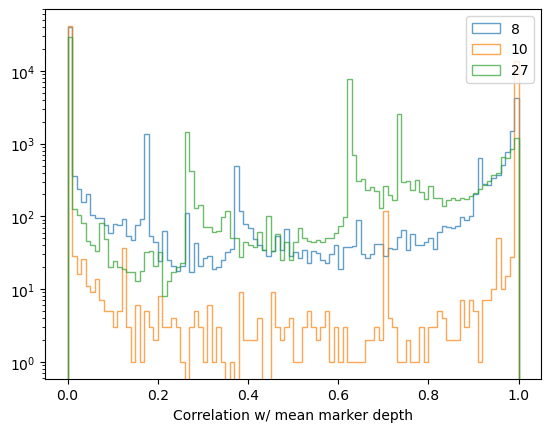

In [49]:
bins = np.linspace(0, 1, num=101)

for strain in highest_power_strain_list:
    plt.hist(strain_corr[strain], bins=bins, alpha=0.7, histtype='step', label=strain)
plt.legend()
plt.xlabel('Correlation w/ mean marker depth')
plt.yscale('log')
None

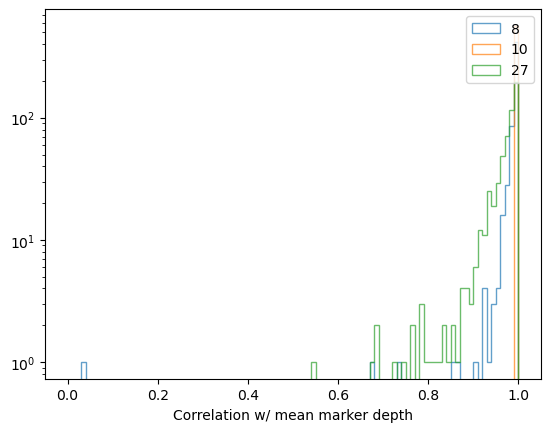

In [50]:
bins = np.linspace(0, 1, num=101)

for strain in highest_power_strain_list:
    plt.hist(strain_corr[strain][species_gene_list], bins=bins, alpha=0.7, histtype='step', label=strain)
plt.legend()
plt.xlabel('Correlation w/ mean marker depth')
plt.yscale('log')
None

(-3.0, 3.0)

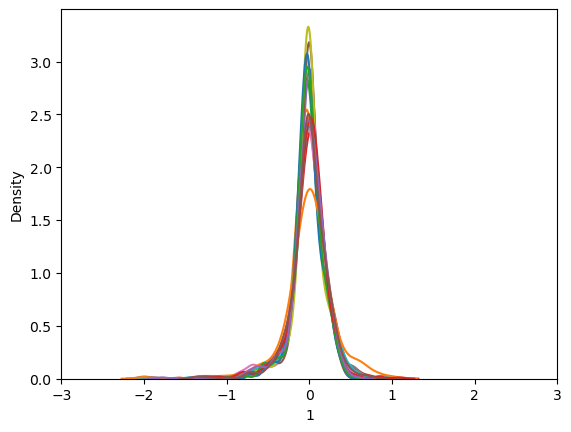

In [51]:
pseudo = 1e-2

for strain in high_power_strain_list:
    sns.kdeplot(np.log10(strain_depth.loc[species_gene_list][strain] + pseudo), label=strain)

plt.xlim(-3, 3)

# Enrichment Analysis

In [52]:
strict_corr_hit = strain_corr > strain_meta.corr_threshold_strict
lenient_corr_hit = strain_corr > strain_meta.corr_threshold_lenient
moderate_corr_hit = strain_corr > strain_meta.corr_threshold_moderate
low_corr =  strain_corr < strain_meta.corr_threshold_lenient

low_depth = (strain_depth < strain_meta.depth_thresh_low)
depth_hit = ~low_depth
high_depth = (strain_depth > strain_meta.depth_thresh_high)
high_confidence_hit = depth_hit & strict_corr_hit
moderate_hit = depth_hit & moderate_corr_hit
maybe_hit = depth_hit & lenient_corr_hit
low_depth_hit = low_depth & strict_corr_hit
high_depth_hit = high_depth & strict_corr_hit
ambiguous_hit = depth_hit ^ strict_corr_hit
high_confidence_not_hit = low_depth & low_corr

/tmp/bsmith/ipykernel_46443/922024519.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  strict_corr_hit = strain_corr > strain_meta.corr_threshold_strict
/tmp/bsmith/ipykernel_46443/922024519.py:2: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  lenient_corr_hit = strain_corr > strain_meta.corr_threshold_lenient
/tmp/bsmith/ipykernel_46443/922024519.py:3: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  moderate_corr_hit = strain_corr > strain_meta.corr_threshold_moderate
/tmp/bs

In [53]:
(
    high_confidence_hit[high_power_strain_list].sum().median(),
    maybe_hit[high_power_strain_list].sum().median(),
)

(4325.0, 4967.0)

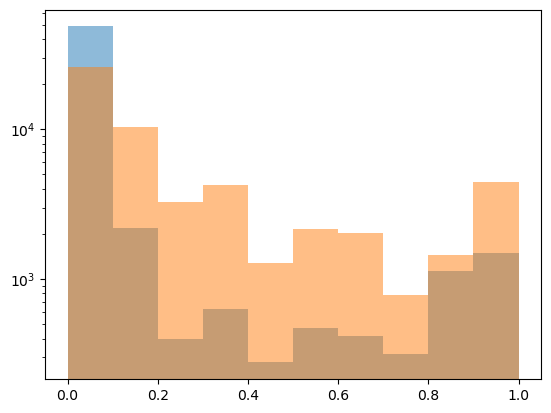

In [54]:
bins = np.linspace(0, 1, num=11)

plt.hist(high_confidence_hit[high_power_strain_list].mean(1), bins=bins, alpha=0.5)
# plt.hist(medium_confidence_hit.mean(1), bins=bins, alpha=0.5)
plt.hist(1 - high_confidence_not_hit[high_power_strain_list].mean(1), bins=bins, alpha=0.5)
# plt.hist(highest_confidence_hit.mean(1), bins=bins, alpha=0.5)

plt.yscale('log')

None

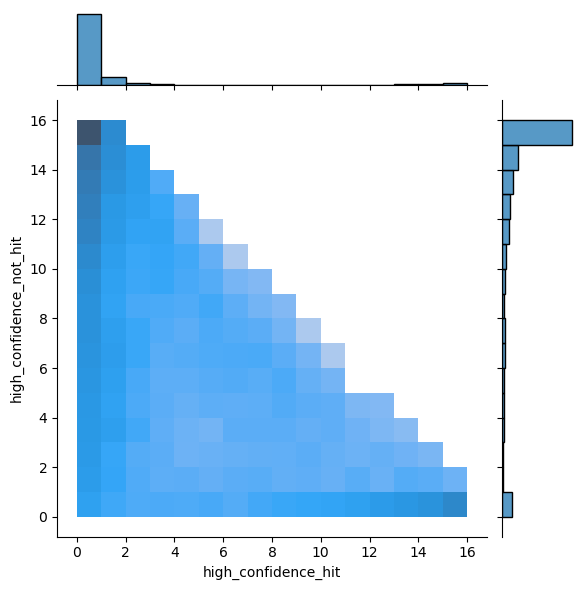

In [56]:
d = pd.DataFrame(dict(high_confidence_hit=high_confidence_hit[high_power_strain_list].sum(1),
                      high_confidence_not_hit=high_confidence_not_hit[high_power_strain_list].sum(1)
                     ))
_max = high_confidence_hit[high_power_strain_list].shape[1]

sns.jointplot(
    x='high_confidence_hit',
    y='high_confidence_not_hit',
    data=d,
    kind='hist',
    bins=(_max, _max),
    norm=mpl.colors.PowerNorm(1/5),
    vmin=None,
    vmax=None,
)

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


2539 1899

tRNA modification                              30
TCA cycle                                      12
Aromatic amino acid biosynthesis               12
16S rRNA modification                          11
Heme biosynthesis                              11
Isoleucine, leucine, valine biosynthesis       11
Aminoacyl-tRNA synthetases                     11
Fatty acid biosynthesis                        11
23S rRNA modification                          10
Non-phosphorylated Entner-Doudoroff pathway     9
Name: pathway, dtype: int64

hypothetical protein                                             640
Vitamin B12 import ATP-binding protein BtuD                       29
putative protein                                                   7
L-threonine 3-dehydrogenase                                        5
Anaerobic nitric oxide reductase transcription regulator NorR      4
Periplasmic nitrate reductase                                      4
Putrescine transporter PotE                   

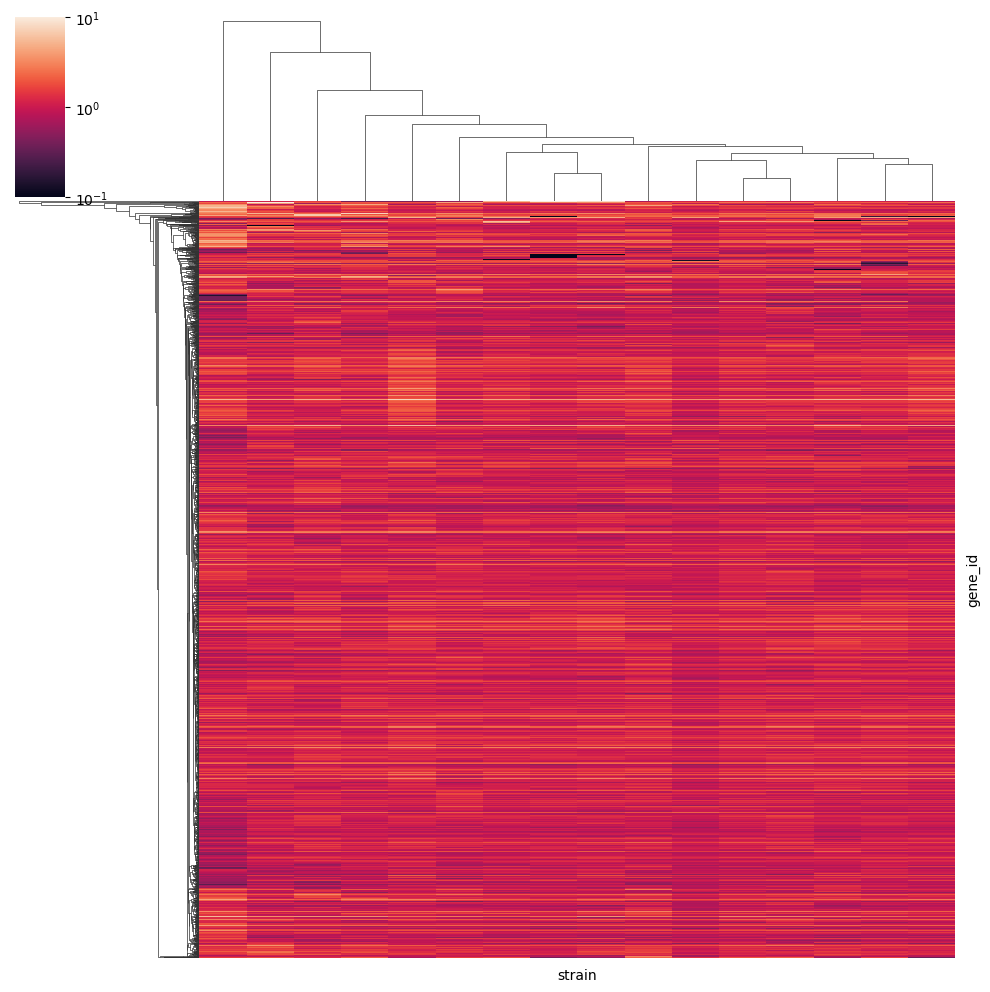

In [57]:
genes_list = idxwhere((high_confidence_hit[high_power_strain_list].mean(1) > 0.8) & (high_confidence_not_hit[high_power_strain_list].mean(1) < 0.05))
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=0,
        xticklabels=0,
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

In [58]:
pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category)

,category,description
E,179,Amino acid transport and metabolism
G,136,Carbohydrate transport and metabolism
M,135,Cell wall/membrane/envelope biogenesis
C,119,Energy production and conversion
J,108,"Translation, ribosomal structure and biogenesis"
P,100,Inorganic ion transport and metabolism
K,93,Transcription
T,92,Signal transduction mechanisms
H,91,Coenzyme transport and metabolism
R,79,General function prediction only


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


5142 3027

tRNA modification                              34
TCA cycle                                      24
Fatty acid biosynthesis                        23
Ribosome 50S subunit                           22
Glycolysis                                     21
Aminoacyl-tRNA synthetases                     18
Non-phosphorylated Entner-Doudoroff pathway    16
Isoleucine, leucine, valine biosynthesis       15
16S rRNA modification                          12
Aromatic amino acid biosynthesis               12
Name: pathway, dtype: int64

hypothetical protein                               2115
Vitamin B12 import ATP-binding protein BtuD          44
Sialic acid transporter NanT                          8
putative protein                                      8
HTH-type transcriptional repressor NanR               8
L-threonine 3-dehydrogenase                           7
Tyrosine recombinase XerC                             7
Glucitol operon repressor                             6
Vitamin B12 

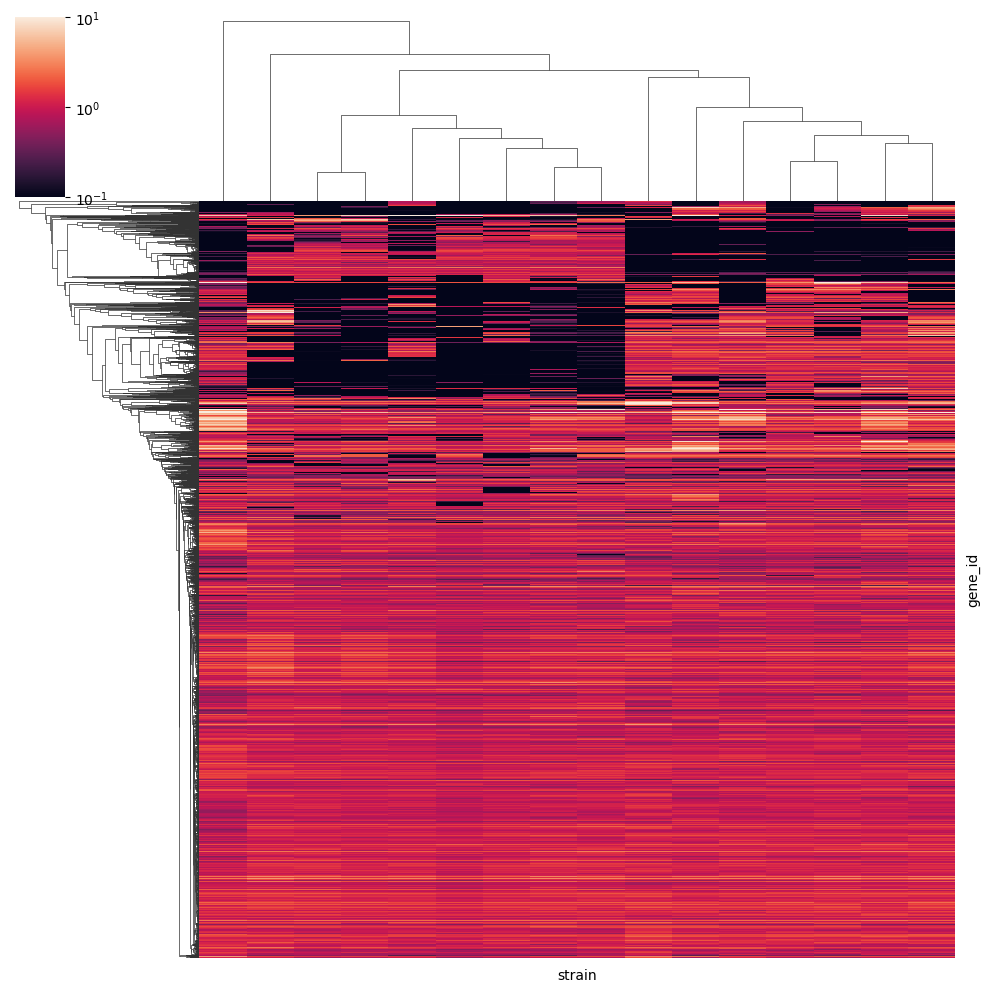

In [103]:
genes_list = idxwhere((high_confidence_hit[high_power_strain_list].mean(1) > 0.2))
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=0,
        xticklabels=0,
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


5050 1399

tRNA modification                              10
Non-phosphorylated Entner-Doudoroff pathway     8
Cobalamine/B12 biosynthesis                     7
Methionine biosynthesis                         7
Ribosome 30S subunit                            6
Glycolysis                                      6
Proline degradation                             6
Isoprenoid biosynthesis                         5
Ribosome 50S subunit                            5
Pyrimidine degradation                          5
Name: pathway, dtype: int64

hypothetical protein                          3651
Tyrosine recombinase XerC                       21
Prophage integrase IntA                         15
putative protein                                 7
Chromosome partition protein Smc                 7
Prophage integrase IntS                          7
dTDP-4-dehydrorhamnose 3,5-epimerase             6
D-inositol-3-phosphate glycosyltransferase       6
DNA-invertase hin                                6
H

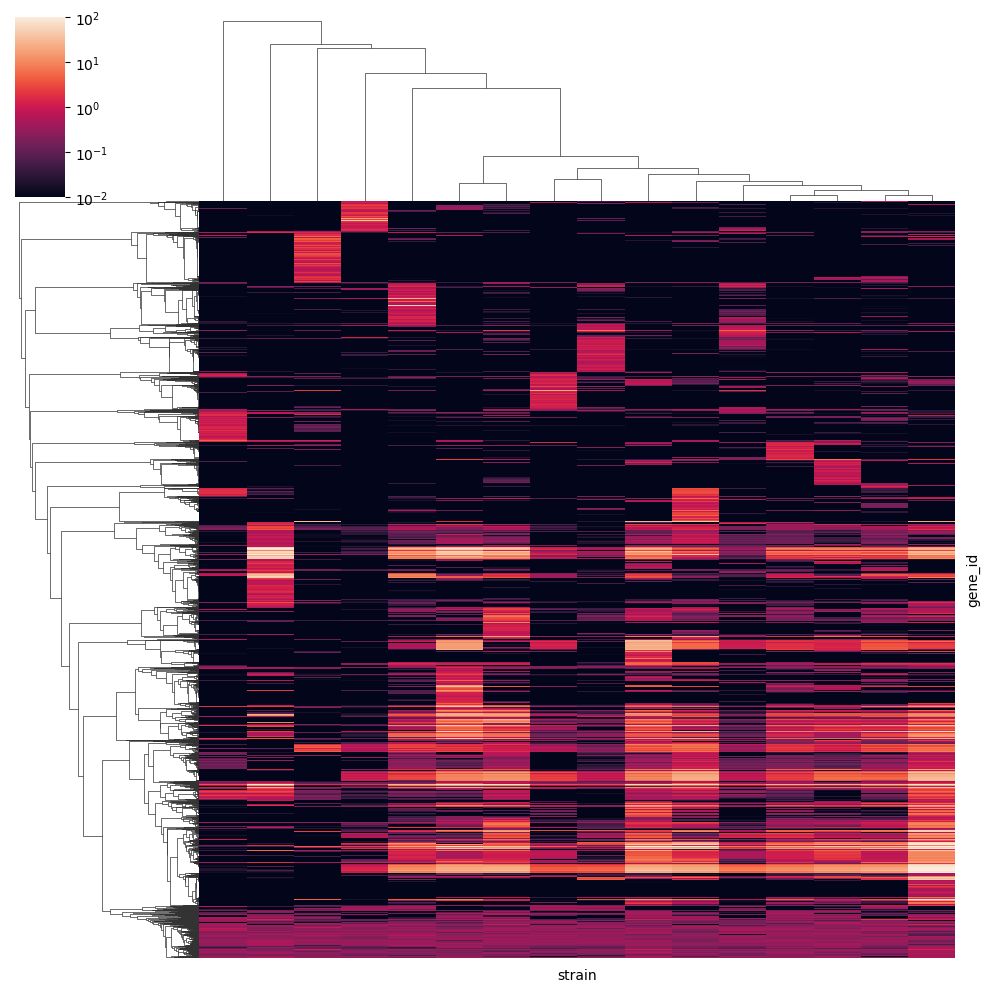

In [102]:
genes_list = idxwhere(high_confidence_hit[high_power_strain_list].sum(1) == 1)
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=1e-2, vmax=1e2),
        yticklabels=0,
        xticklabels=0,
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

In [101]:
pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category)

,category,description
E,89,Amino acid transport and metabolism
M,83,Cell wall/membrane/envelope biogenesis
G,78,Carbohydrate transport and metabolism
L,75,"Replication, recombination and repair"
P,57,Inorganic ion transport and metabolism
K,55,Transcription
C,52,Energy production and conversion
J,44,"Translation, ribosomal structure and biogenesis"
T,41,Signal transduction mechanisms
X,36,"Mobilome: prophages, transposons"


# Enrichment Analysis using Depth-only Selection

## Standard Depth Ratio

In [61]:
low_depth_hit = (strain_depth < strain_meta.depth_thresh_low)

/tmp/bsmith/ipykernel_46443/3693257472.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  low_depth_hit = (strain_depth < strain_meta.depth_thresh_low)


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


2955 2180

tRNA modification                           34
Ribosome 50S subunit                        20
TCA cycle                                   16
Fatty acid biosynthesis                     15
Aminoacyl-tRNA synthetases                  15
Ribosome 30S subunit                        13
Isoleucine, leucine, valine biosynthesis    13
Glycolysis                                  13
Pyrimidine salvage                          12
16S rRNA modification                       12
Name: pathway, dtype: int64

hypothetical protein                              775
Vitamin B12 import ATP-binding protein BtuD        35
putative protein                                    7
L-threonine 3-dehydrogenase                         5
HTH-type transcriptional repressor NanR             5
Putrescine transporter PotE                         4
Multidrug resistance protein MdtL                   4
p-hydroxybenzoic acid efflux pump subunit AaeA      4
HTH-type transcriptional repressor PurR             4
HTH-

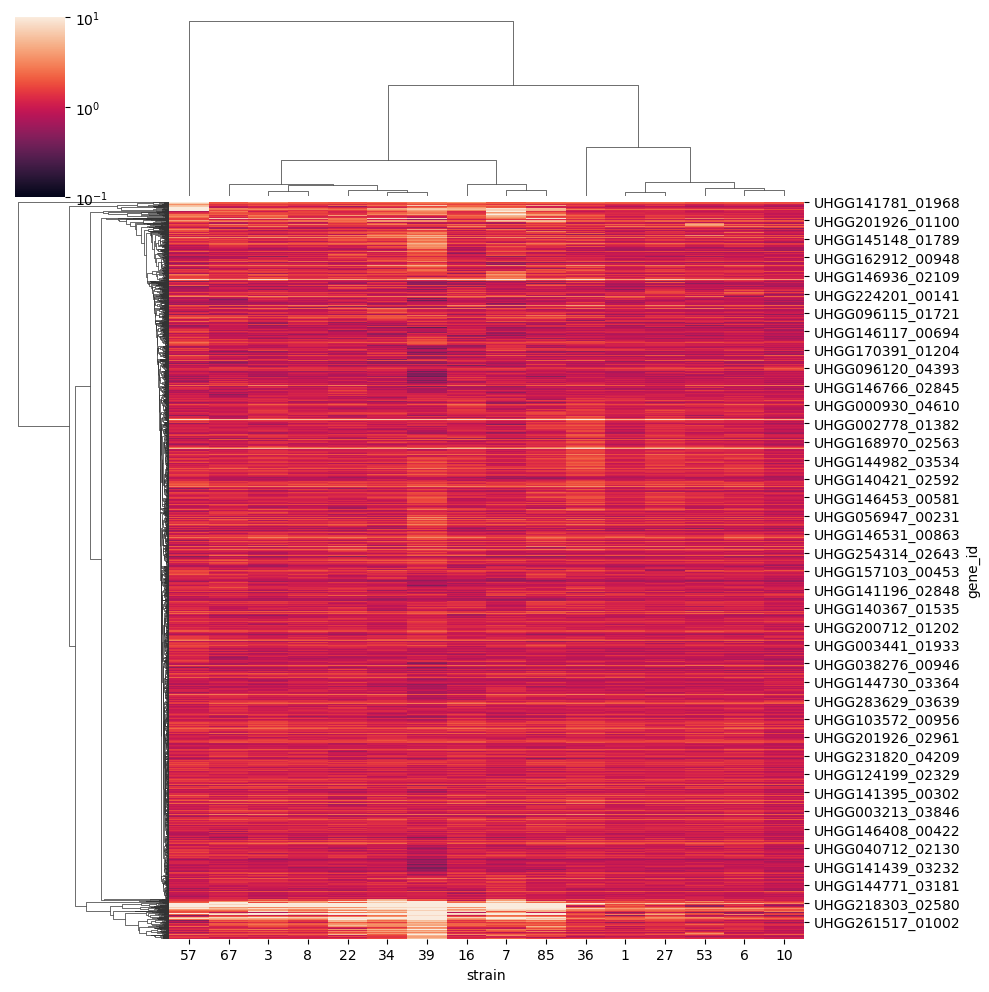

In [62]:
genes_list = idxwhere((depth_hit[high_power_strain_list].mean(1) > 0.8) & (low_depth_hit[high_power_strain_list].mean(1) < 0.05))
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10)
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


15374 5134

tRNA modification                   46
Glycolysis                          32
Fatty acid biosynthesis             31
Aromatic amino acid biosynthesis    27
RNA polymerase                      24
TCA cycle                           24
Cobalamine/B12 biosynthesis         22
Heme biosynthesis                   22
Ribosome 50S subunit                22
Aminoacyl-tRNA synthetases          21
Name: pathway, dtype: int64

hypothetical protein                                  10240
Tyrosine recombinase XerC                                58
Prophage integrase IntA                                  30
Vitamin B12 import ATP-binding protein BtuD              27
HTH-type transcriptional activator RhaR                  20
putative protein                                         16
Adaptive-response sensory-kinase SasA                    14
DNA-invertase hin                                        14
Macrolide export ATP-binding/permease protein MacB       14
Sensor histidine kinase RcsC 

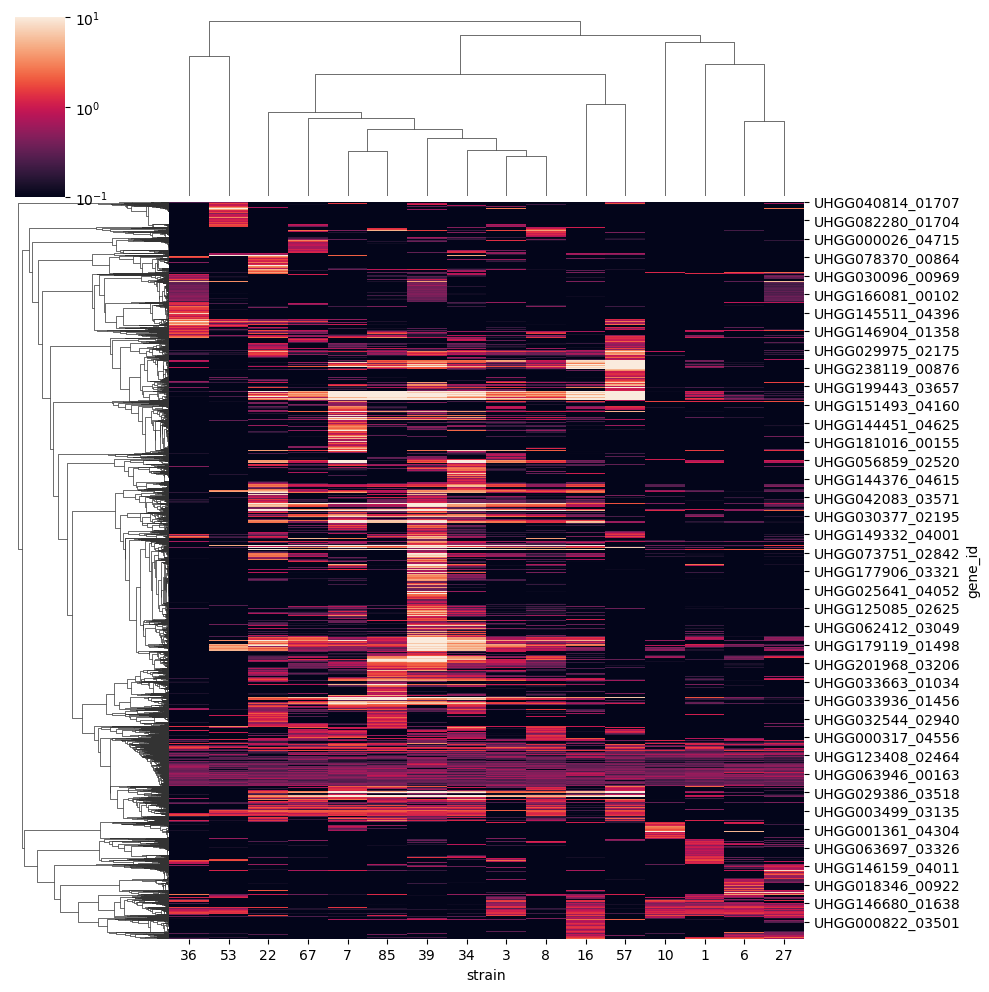

In [63]:
genes_list = idxwhere((depth_hit[high_power_strain_list].mean(1) > 0.05) & (low_depth_hit[high_power_strain_list].mean(1) > 0.2))
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10)
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

# Enrichment Analysis in Reference Genomes

In [64]:
x = (reference_gene > 0)
y = high_confidence_hit

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=False)
y = y.reindex(_all_genes, fill_value=False)

jac_cdist_inf = pd.DataFrame(sp.spatial.distance.cdist(x.T, y.T, metric='jaccard'), index=x.columns, columns=y.columns)

In [65]:
high_confidence_diff = pd.DataFrame(x[jac_cdist_inf.idxmin()].values * 2 - y[jac_cdist_inf.columns].values * 3, index=x.index, columns=y.columns).replace({-3: 'only_inf', -1: 'shared_genes', 0: 'both_lacking', 2: 'only_ref'})
high_confidence_diff.apply(lambda x: x.value_counts())[high_power_strain_list]

strain,1,3,6,7,8,10,16,22,27,34,36,39,53,57,67,85
both_lacking,77188,77975,77029,77007,77418,77876,77253,77020,78173,77285,77265,76163,77187,76708,76744,77203
only_inf,1055,433,981,882,487,751,838,796,544,705,482,2156,938,1060,1253,735
only_ref,573,695,806,606,669,873,698,576,962,654,1396,536,666,486,678,528
shared_genes,3353,3066,3353,3674,3595,2669,3380,3777,2490,3525,3026,3314,3378,3915,3494,3703


In [66]:
x = (reference_gene > 0)
y = moderate_hit

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=False)
y = y.reindex(_all_genes, fill_value=False)

jac_cdist_inf4 = pd.DataFrame(sp.spatial.distance.cdist(x.T, y.T, metric='jaccard'), index=x.columns, columns=y.columns)

In [67]:
moderate_diff = pd.DataFrame(x[jac_cdist_inf4.idxmin()].values * 2 - y[jac_cdist_inf4.columns].values * 3, index=x.index, columns=y.columns).replace({-3: 'only_inf', -1: 'shared_genes', 0: 'both_lacking', 2: 'only_ref'})
moderate_diff.apply(lambda x: x.value_counts())[high_power_strain_list]

strain,1,3,6,7,8,10,16,22,27,34,36,39,53,57,67,85
both_lacking,77081,77903,76975,76894,77341,77822,77177,76916,78075,77177,77176,74447,77099,76571,76502,77031
only_inf,1162,505,1035,995,564,805,914,900,642,813,571,3650,1026,1197,1495,907
only_ref,429,508,655,473,446,557,490,377,734,490,1020,453,432,288,391,306
shared_genes,3497,3253,3504,3807,3818,2985,3588,3976,2718,3689,3402,3619,3612,4113,3781,3925


(1.0, -1e-05)

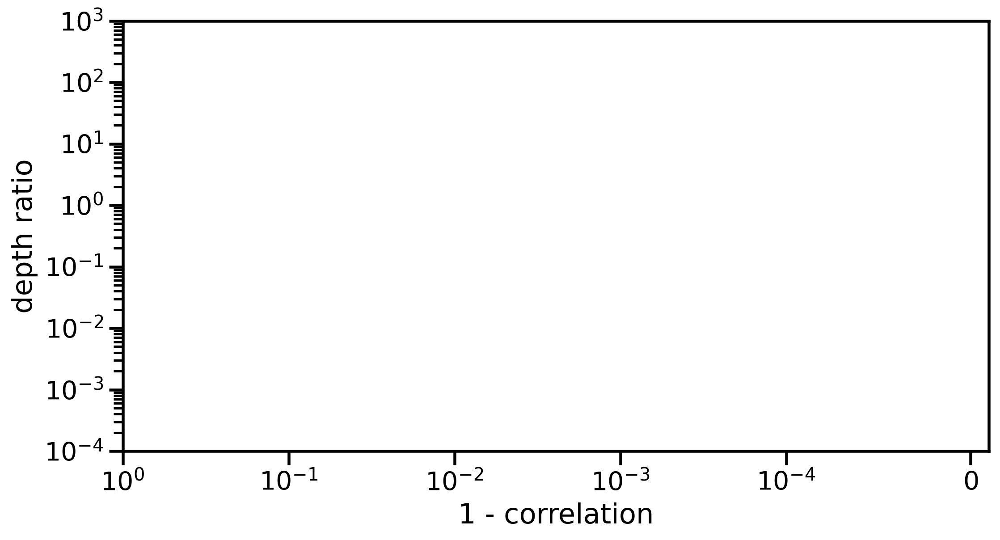

In [832]:
d = pd.DataFrame(dict(
    corr_complement=1 - species_corr,
    species_corr=species_corr,
    depth=global_species_gene_depth,
))

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.scatter(
    [],
    [],
    # c='darkorange',
    # data=d[d.species_corr > species_gene_corr_thresh],
    s=1.0,
    alpha=0.7,
    zorder=1,
)

ax.set_yscale('log')
ax.set_xlabel('1 - correlation')
ax.set_ylabel('depth ratio')
ax.set_xscale('symlog', linthresh=1e-4)
ax.xaxis.set_inverted(True)
ax.set_ylim(1e-4, 1e3)
ax.set_xlim(1.0, -1e-5)

(1.0, -1e-05)

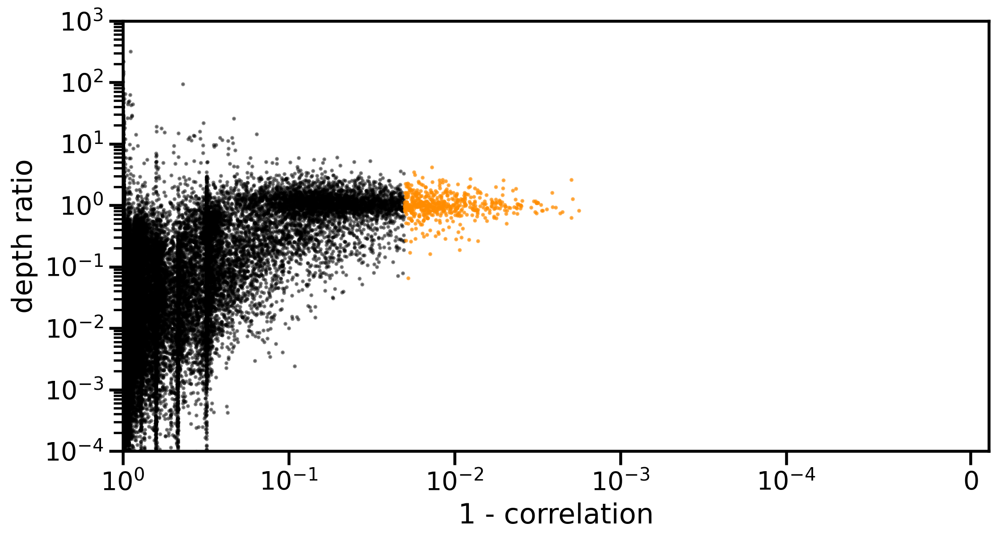

In [828]:
d = pd.DataFrame(dict(
    corr_complement=1 - species_corr,
    species_corr=species_corr,
    depth=global_species_gene_depth,
))

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.scatter(
    'corr_complement',
    'depth',
    c='darkorange',
    data=d[d.species_corr > species_gene_corr_thresh],
    s=1.0,
    alpha=0.7,
    zorder=1,
)
ax.scatter(
    'corr_complement',
    'depth',
    c='black',
    data=d[d.species_corr <= species_gene_corr_thresh],
    s=1.0,
    alpha=0.5,
    zorder=0,
)

ax.set_yscale('log')
ax.set_xlabel('1 - correlation')
ax.set_ylabel('depth ratio')
ax.set_xscale('symlog', linthresh=1e-4)
ax.xaxis.set_inverted(True)
ax.set_ylim(1e-4, 1e3)
ax.set_xlim(1.0, -1e-5)

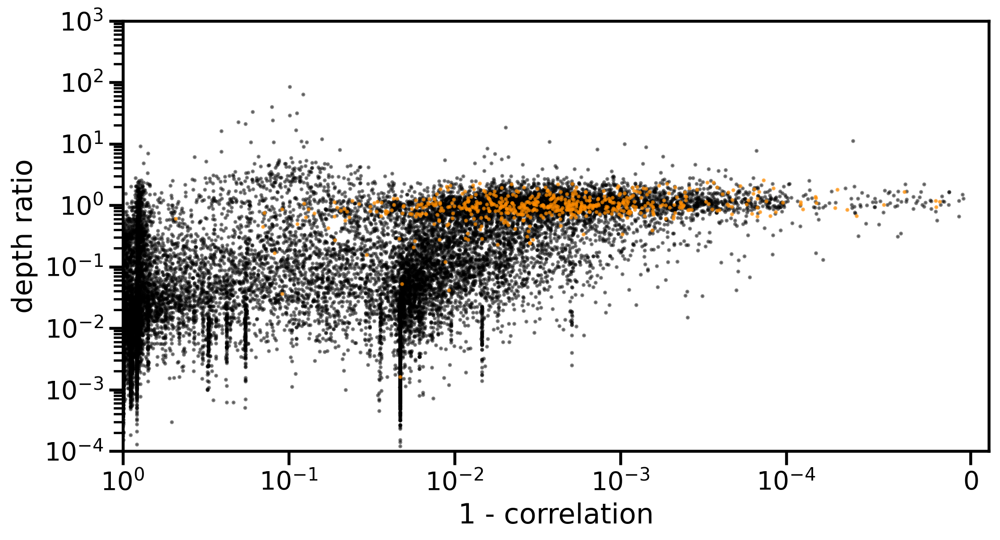

In [829]:
for strain in [1]:
    d = pd.DataFrame(dict(
        match_type=high_confidence_diff[strain],
        corr_complement=1 - strain_corr[strain],
        # species_is_top_corr=(strain_by_species_corr.sel(strain=strain).max('species_id') <= strain_by_species_corr.sel(strain=strain, species_id=species_id)).to_series(),
        species_corr=species_corr,
        depth=strain_depth[strain],
    ))

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.scatter(
        'corr_complement',
        'depth',
        c='darkorange',
        data=d[d.species_corr > species_gene_corr_thresh],
        s=1.0,
        alpha=0.7,
        zorder=1,
    )
    ax.scatter(
        'corr_complement',
        'depth',
        c='black',
        data=d[d.species_corr <= species_gene_corr_thresh],
        s=1.0,
        alpha=0.5,
        zorder=0,
    )


    # ax.set_title(strain)
    
#     # Strict
#     right = 1 - strain_meta.loc[strain].corr_threshold_strict
#     left = 0
#     top = strain_meta.depth_thresh_high[strain]
#     bottom = strain_meta.depth_thresh_low[strain]
#     ax.vlines(right, ymin=bottom, ymax=1e3, linestyle='--', color='r')
#     # ax.add_patch(mpl.patches.Rectangle(
#     #     (left, bottom),
#     #     right - left,
#     #     top - bottom,
#     #     linestyle='--',
#     #     facecolor='none',
#     #     edgecolor='red',
#     #     lw=2
#     # ))
    
#     # Lenient
#     right = 1 - strain_meta.loc[strain].corr_threshold_moderate
#     left = 0
#     top = strain_meta.depth_thresh_high[strain]
#     bottom = strain_meta.depth_thresh_low[strain]
#     ax.vlines(right, ymin=bottom, ymax=1e3, linestyle=':', color='r')
#     ax.hlines(bottom, xmin=0, xmax=right, linestyle='--', color='r')
#     # ax.add_patch(mpl.patches.Rectangle(
#     #     (left, bottom),
#     #     right - left,
#     #     top - bottom,
#     #     linestyle='--',
#     #     facecolor='none',
#     #     edgecolor='red',
#     #     lw=2
#     # ))
    
    # ax.axvline(1 - strain_meta.loc[strain].corr_threshold, linestyle='--', color='k', lw=1)
    # ax.axhline(depth_ratio_bound, linestyle='--', color='k', lw=1)
    # ax.axhline(1 / depth_ratio_bound, linestyle='--', color='k', lw=1)
    ax.set_yscale('log')
    ax.set_xlabel('1 - correlation')
    ax.set_ylabel('depth ratio')
    ax.set_xscale('symlog', linthresh=1e-4)
    ax.xaxis.set_inverted(True)
    ax.set_ylim(1e-4, 1e3)
    ax.set_xlim(1.0, -1e-5)

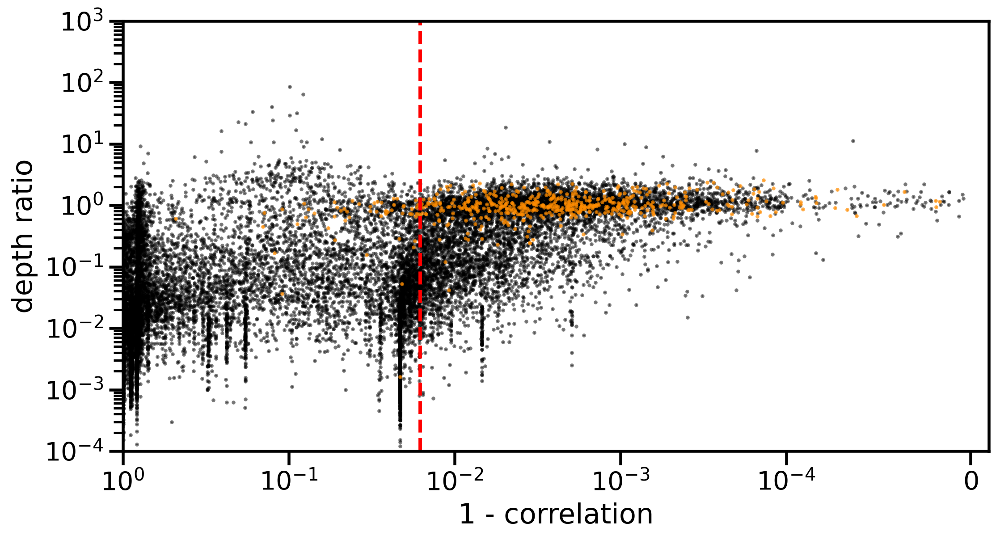

In [830]:
for strain in [1]:
    d = pd.DataFrame(dict(
        match_type=high_confidence_diff[strain],
        corr_complement=1 - strain_corr[strain],
        # species_is_top_corr=(strain_by_species_corr.sel(strain=strain).max('species_id') <= strain_by_species_corr.sel(strain=strain, species_id=species_id)).to_series(),
        species_corr=species_corr,
        depth=strain_depth[strain],
    ))

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.scatter(
        'corr_complement',
        'depth',
        c='darkorange',
        data=d[d.species_corr > species_gene_corr_thresh],
        s=1.0,
        alpha=0.7,
        zorder=1,
    )
    ax.scatter(
        'corr_complement',
        'depth',
        c='black',
        data=d[d.species_corr <= species_gene_corr_thresh],
        s=1.0,
        alpha=0.5,
        zorder=0,
    )


    # ax.set_title(strain)
    
    # Strict
    right = 1 - strain_meta.loc[strain].corr_threshold_strict
    left = 0
    top = strain_meta.depth_thresh_high[strain]
    bottom = strain_meta.depth_thresh_low[strain]
    ax.axvline(right, linestyle='--', color='r')
    # ax.add_patch(mpl.patches.Rectangle(
    #     (left, bottom),
    #     right - left,
    #     top - bottom,
    #     linestyle='--',
    #     facecolor='none',
    #     edgecolor='red',
    #     lw=2
    # ))
    
    # # Lenient
    # right = 1 - strain_meta.loc[strain].corr_threshold_moderate
    # left = 0
    # top = strain_meta.depth_thresh_high[strain]
    # bottom = strain_meta.depth_thresh_low[strain]
    # ax.vlines(right, ymin=bottom, ymax=1e3, linestyle=':', color='r')
    # ax.hlines(bottom, xmin=0, xmax=right, linestyle='--', color='r')
    # # ax.add_patch(mpl.patches.Rectangle(
    # #     (left, bottom),
    # #     right - left,
    # #     top - bottom,
    # #     linestyle='--',
    # #     facecolor='none',
    # #     edgecolor='red',
    # #     lw=2
    # # ))
    
    # ax.axvline(1 - strain_meta.loc[strain].corr_threshold, linestyle='--', color='k', lw=1)
    # ax.axhline(depth_ratio_bound, linestyle='--', color='k', lw=1)
    # ax.axhline(1 / depth_ratio_bound, linestyle='--', color='k', lw=1)
    ax.set_yscale('log')
    ax.set_xlabel('1 - correlation')
    ax.set_ylabel('depth ratio')
    ax.set_xscale('symlog', linthresh=1e-4)
    ax.xaxis.set_inverted(True)
    ax.set_ylim(1e-4, 1e3)
    ax.set_xlim(1.0, -1e-5)

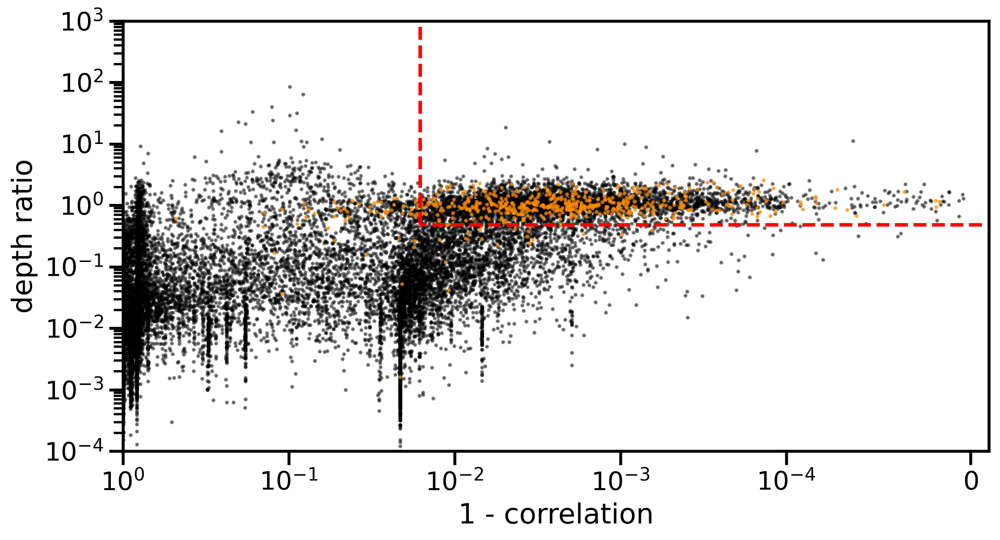

In [831]:
for strain in [1]:
    d = pd.DataFrame(dict(
        match_type=high_confidence_diff[strain],
        corr_complement=1 - strain_corr[strain],
        # species_is_top_corr=(strain_by_species_corr.sel(strain=strain).max('species_id') <= strain_by_species_corr.sel(strain=strain, species_id=species_id)).to_series(),
        species_corr=species_corr,
        depth=strain_depth[strain],
    ))

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.scatter(
        'corr_complement',
        'depth',
        c='darkorange',
        data=d[d.species_corr > species_gene_corr_thresh],
        s=1.0,
        alpha=0.7,
        zorder=1,
    )
    ax.scatter(
        'corr_complement',
        'depth',
        c='black',
        data=d[d.species_corr <= species_gene_corr_thresh],
        s=1.0,
        alpha=0.5,
        zorder=0,
    )


    # ax.set_title(strain)
    
    # Strict
    right = 1 - strain_meta.loc[strain].corr_threshold_strict
    left = 0
    top = strain_meta.depth_thresh_high[strain]
    bottom = strain_meta.depth_thresh_low[strain]
    ax.vlines(right, ymin=bottom, ymax=1e10, linestyle='--', color='r')
    ax.hlines(bottom, xmax=right, xmin=-1, linestyle='--', color='r')
    # ax.add_patch(mpl.patches.Rectangle(
    #     (left, bottom),
    #     right - left,
    #     top - bottom,
    #     linestyle='--',
    #     facecolor='none',
    #     edgecolor='red',
    #     lw=2
    # ))
    
    # # Lenient
    # right = 1 - strain_meta.loc[strain].corr_threshold_moderate
    # left = 0
    # top = strain_meta.depth_thresh_high[strain]
    # bottom = strain_meta.depth_thresh_low[strain]
    # ax.vlines(right, ymin=bottom, ymax=1e3, linestyle=':', color='r')
    # # ax.add_patch(mpl.patches.Rectangle(
    # #     (left, bottom),
    # #     right - left,
    # #     top - bottom,
    # #     linestyle='--',
    # #     facecolor='none',
    # #     edgecolor='red',
    # #     lw=2
    # # ))
    
    # ax.axvline(1 - strain_meta.loc[strain].corr_threshold, linestyle='--', color='k', lw=1)
    # ax.axhline(depth_ratio_bound, linestyle='--', color='k', lw=1)
    # ax.axhline(1 / depth_ratio_bound, linestyle='--', color='k', lw=1)
    ax.set_yscale('log')
    ax.set_xlabel('1 - correlation')
    ax.set_ylabel('depth ratio')
    ax.set_xscale('symlog', linthresh=1e-4)
    ax.xaxis.set_inverted(True)
    ax.set_ylim(1e-4, 1e3)
    ax.set_xlim(1.0, -1e-5)

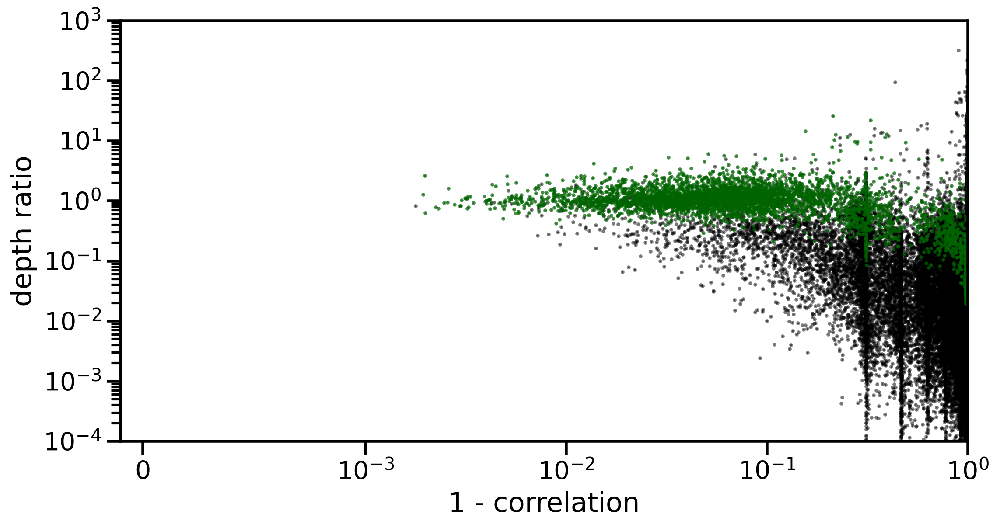

In [166]:
for strain in [1]:
    gene_list = high_confidence_hit.index
    d = pd.DataFrame(dict(
        strain_gene=high_confidence_hit[strain],
        corr_complement=1 - species_corr.loc[gene_list],
        depth=global_species_gene_depth.loc[gene_list],
    ))

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.scatter(
        'corr_complement',
        'depth',
        c='darkgreen',
        data=d[d.strain_gene],
        s=1.0,
        alpha=0.7,
        zorder=1,
    )
    ax.scatter(
        'corr_complement',
        'depth',
        c='black',
        data=d[~d.strain_gene],
        s=1.0,
        alpha=0.5,
        zorder=0,
    )


    # ax.set_title(strain)
    
    # Strict
    # right = 1 - strain_meta.loc[strain].corr_threshold_strict
    # left = 0
    # top = strain_meta.depth_thresh_high[strain]
    # bottom = strain_meta.depth_thresh_low[strain]
    # ax.axvline(right, linestyle='--', color='r')
    # ax.add_patch(mpl.patches.Rectangle(
    #     (left, bottom),
    #     right - left,
    #     top - bottom,
    #     linestyle='--',
    #     facecolor='none',
    #     edgecolor='red',
    #     lw=2
    # ))
    
    # # Lenient
    # right = 1 - strain_meta.loc[strain].corr_threshold_moderate
    # left = 0
    # top = strain_meta.depth_thresh_high[strain]
    # bottom = strain_meta.depth_thresh_low[strain]
    # ax.vlines(right, ymin=bottom, ymax=1e3, linestyle=':', color='r')
    # ax.axhline(bottom, linestyle='--', color='r')
    # # ax.add_patch(mpl.patches.Rectangle(
    # #     (left, bottom),
    # #     right - left,
    # #     top - bottom,
    # #     linestyle='--',
    # #     facecolor='none',
    # #     edgecolor='red',
    # #     lw=2
    # # ))
    
    # ax.axvline(1 - strain_meta.loc[strain].corr_threshold, linestyle='--', color='k', lw=1)
    # ax.axhline(depth_ratio_bound, linestyle='--', color='k', lw=1)
    # ax.axhline(1 / depth_ratio_bound, linestyle='--', color='k', lw=1)
    ax.set_yscale('log')
    ax.set_xlabel('1 - correlation')
    ax.set_ylabel('depth ratio')
    ax.set_xscale('symlog', linthresh=1e-3)
    ax.set_ylim(1e-4, 1e3)
    ax.set_xlim(-1e-4, 1.0)

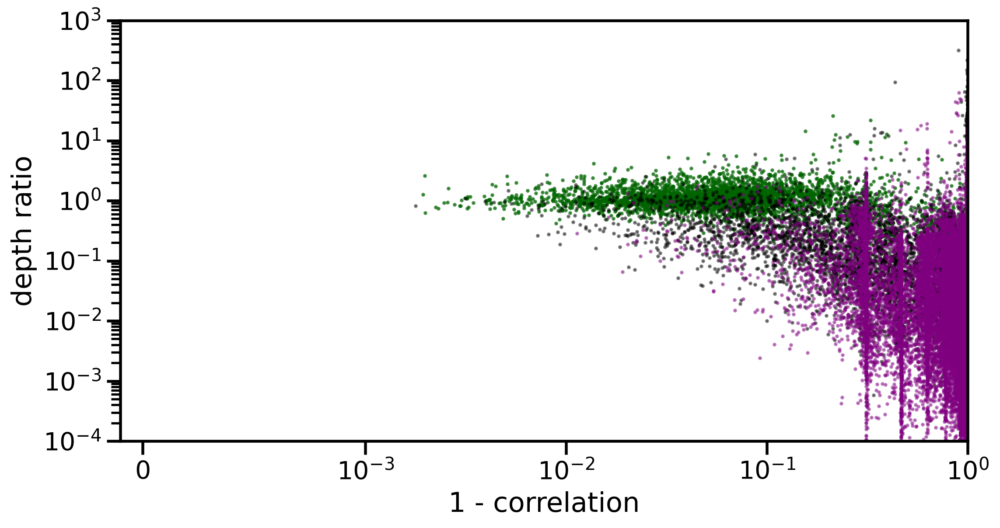

In [170]:
for strain in [1]:
    gene_list = high_confidence_hit.index
    d = pd.DataFrame(dict(
        strain_gene=high_confidence_hit[strain],
        strain_not_gene=high_confidence_not_hit[strain],
        corr_complement=1 - species_corr.loc[gene_list],
        depth=global_species_gene_depth.loc[gene_list],
    ))

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.scatter(
        'corr_complement',
        'depth',
        c='darkgreen',
        data=d[d.strain_gene],
        s=1.0,
        alpha=0.7,
        zorder=0,
    )
    ax.scatter(
        'corr_complement',
        'depth',
        c='black',
        data=d[~d.strain_gene & ~d.strain_not_gene],
        s=1.0,
        alpha=0.5,
        zorder=1,
    )
    ax.scatter(
        'corr_complement',
        'depth',
        c='purple',
        data=d[d.strain_not_gene],
        s=1.0,
        alpha=0.5,
        zorder=2,
    )


    # ax.set_title(strain)
    
    # Strict
    # right = 1 - strain_meta.loc[strain].corr_threshold_strict
    # left = 0
    # top = strain_meta.depth_thresh_high[strain]
    # bottom = strain_meta.depth_thresh_low[strain]
    # ax.axvline(right, linestyle='--', color='r')
    # ax.add_patch(mpl.patches.Rectangle(
    #     (left, bottom),
    #     right - left,
    #     top - bottom,
    #     linestyle='--',
    #     facecolor='none',
    #     edgecolor='red',
    #     lw=2
    # ))
    
    # # Lenient
    # right = 1 - strain_meta.loc[strain].corr_threshold_moderate
    # left = 0
    # top = strain_meta.depth_thresh_high[strain]
    # bottom = strain_meta.depth_thresh_low[strain]
    # ax.vlines(right, ymin=bottom, ymax=1e3, linestyle=':', color='r')
    # ax.axhline(bottom, linestyle='--', color='r')
    # # ax.add_patch(mpl.patches.Rectangle(
    # #     (left, bottom),
    # #     right - left,
    # #     top - bottom,
    # #     linestyle='--',
    # #     facecolor='none',
    # #     edgecolor='red',
    # #     lw=2
    # # ))
    
    # ax.axvline(1 - strain_meta.loc[strain].corr_threshold, linestyle='--', color='k', lw=1)
    # ax.axhline(depth_ratio_bound, linestyle='--', color='k', lw=1)
    # ax.axhline(1 / depth_ratio_bound, linestyle='--', color='k', lw=1)
    ax.set_yscale('log')
    ax.set_xlabel('1 - correlation')
    ax.set_ylabel('depth ratio')
    ax.set_xscale('symlog', linthresh=1e-3)
    ax.set_ylim(1e-4, 1e3)
    ax.set_xlim(-1e-4, 1.0)

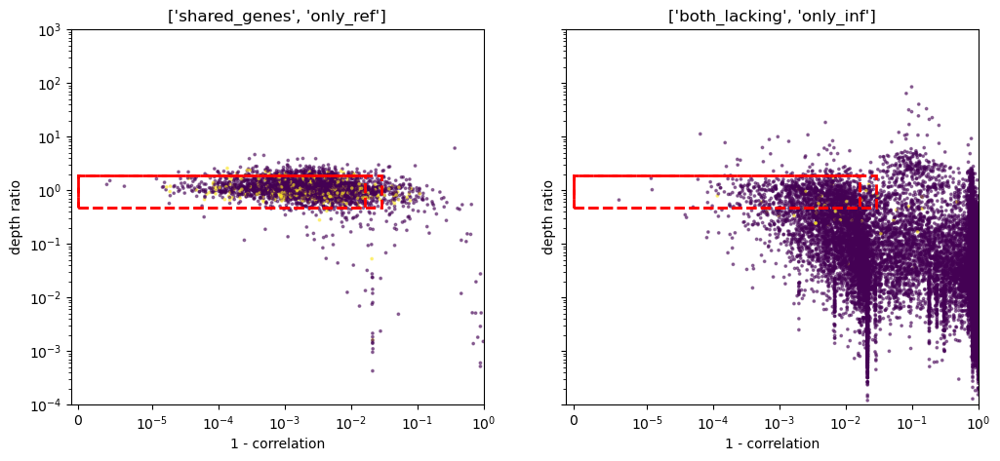

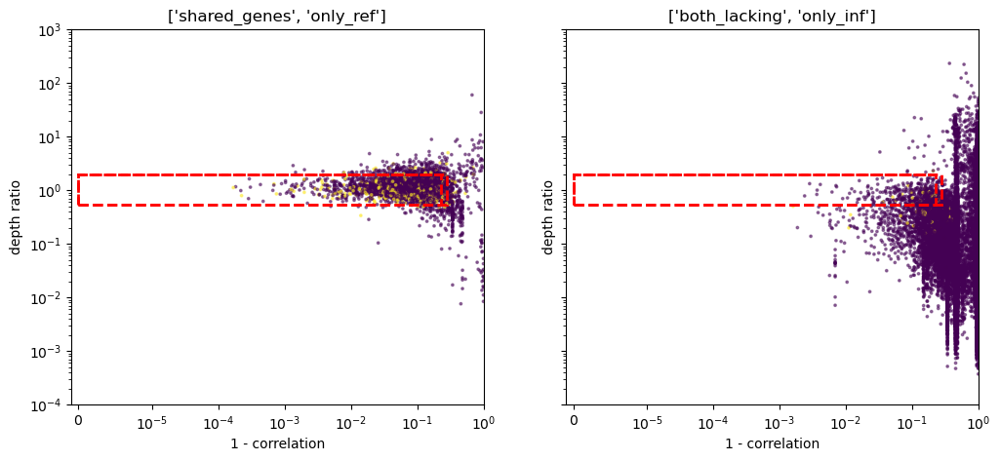

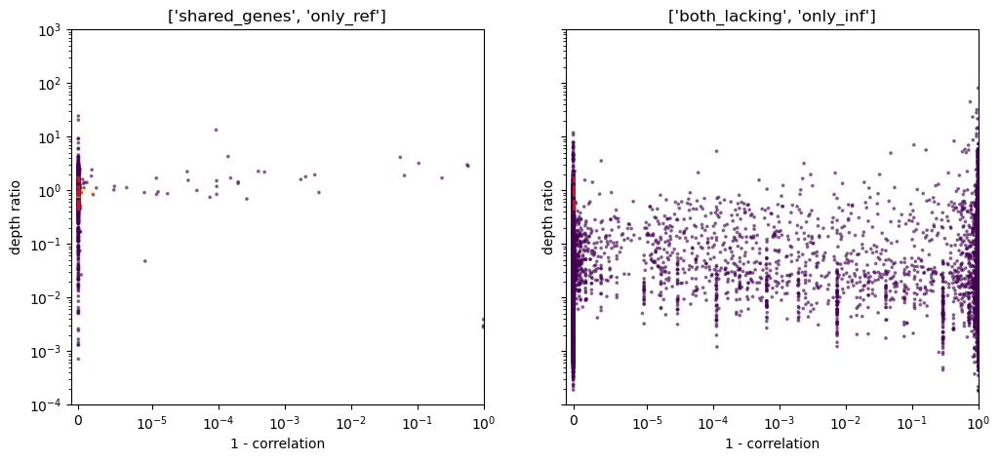

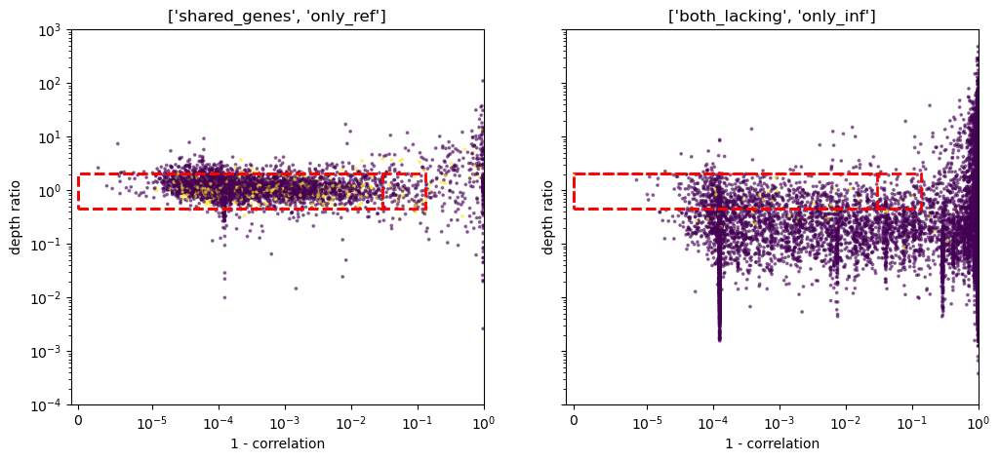

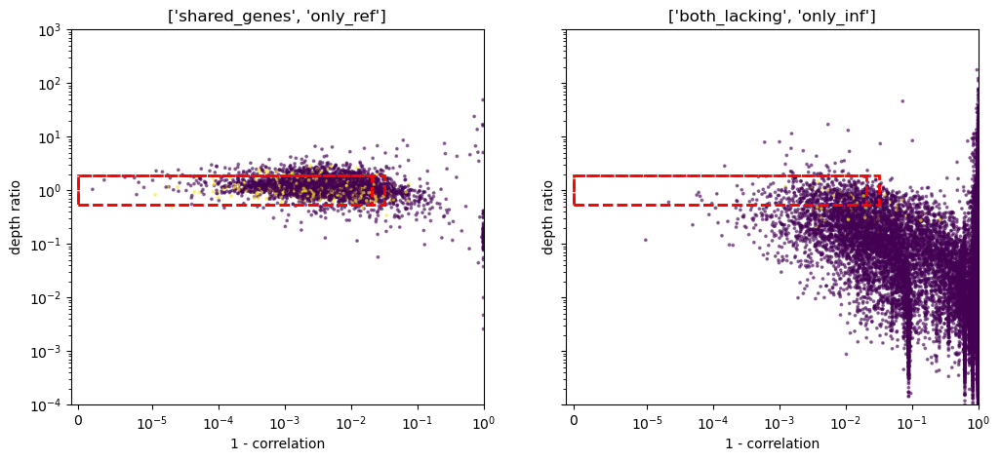

In [71]:
for strain in high_power_strain_list[:5]:
    d = pd.DataFrame(dict(
        match_type=high_confidence_diff[strain],
        corr_complement=1 - strain_corr[strain],
        # species_is_top_corr=(strain_by_species_corr.sel(strain=strain).max('species_id') <= strain_by_species_corr.sel(strain=strain, species_id=species_id)).to_series(),
        species_gene=species_corr > species_gene_corr_thresh,
        depth=strain_depth[strain],
    ))

    fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True)
    match_type_pair_order = [['shared_genes', 'only_ref'], ['both_lacking', 'only_inf']]
    for match_type_pair, ax in zip(match_type_pair_order, axs.flatten()):
        ax.scatter(
            'corr_complement',
            'depth',
            # c='species_is_top_corr',
            c='species_gene',
            data=d[d.match_type.isin(match_type_pair)],
            s=3.0,
            alpha=0.5
        )


    for match_type_pair, ax in zip(match_type_pair_order, axs.flatten()):
        ax.set_title(match_type_pair)
        # Strict
        right = 1 - strain_meta.loc[strain].corr_threshold_strict
        left = 0
        top = strain_meta.depth_thresh_high[strain]
        bottom = strain_meta.depth_thresh_low[strain]
        ax.add_patch(mpl.patches.Rectangle(
            (left, bottom),
            right - left,
            top - bottom,
            linestyle='--',
            facecolor='none',
            edgecolor='red',
            lw=2
        ))

        # Lenient
        right = 1 - strain_meta.loc[strain].corr_threshold_moderate
        left = 0
        top = strain_meta.depth_thresh_high[strain]
        bottom = strain_meta.depth_thresh_low[strain]
        ax.add_patch(mpl.patches.Rectangle(
            (left, bottom),
            right - left,
            top - bottom,
            linestyle='--',
            facecolor='none',
            edgecolor='red',
            lw=2
        ))
        ax.set_yscale('log')
        ax.set_xlabel('1 - correlation')
        ax.set_ylabel('depth ratio')
        ax.set_xscale('symlog', linthresh=1e-5)
        ax.set_ylim(1e-4, 1e3)
        ax.set_xlim(-1e-6, 1.0)

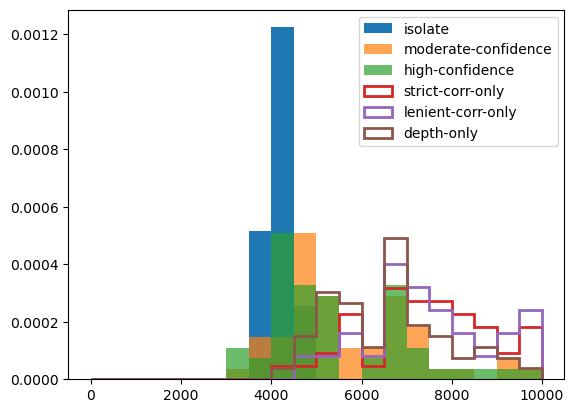

In [72]:
bins = np.linspace(0, 1e4, num=21)

plt.hist((isolate_gene > 0).sum(), density=True, bins=bins, label='isolate')
plt.hist(moderate_hit.sum(), density=True, bins=bins, alpha=0.7, label='moderate-confidence')
plt.hist(high_confidence_hit.sum(), density=True, bins=bins, alpha=0.7, label='high-confidence')
plt.hist(strict_corr_hit.sum(), density=True, bins=bins, histtype='step', lw=2, label='strict-corr-only')
plt.hist(lenient_corr_hit.sum(), density=True, bins=bins, histtype='step', lw=2, label='lenient-corr-only')
plt.hist(depth_hit.sum(), density=True, bins=bins, histtype='step', lw=2, label='depth-only')

plt.legend()
None

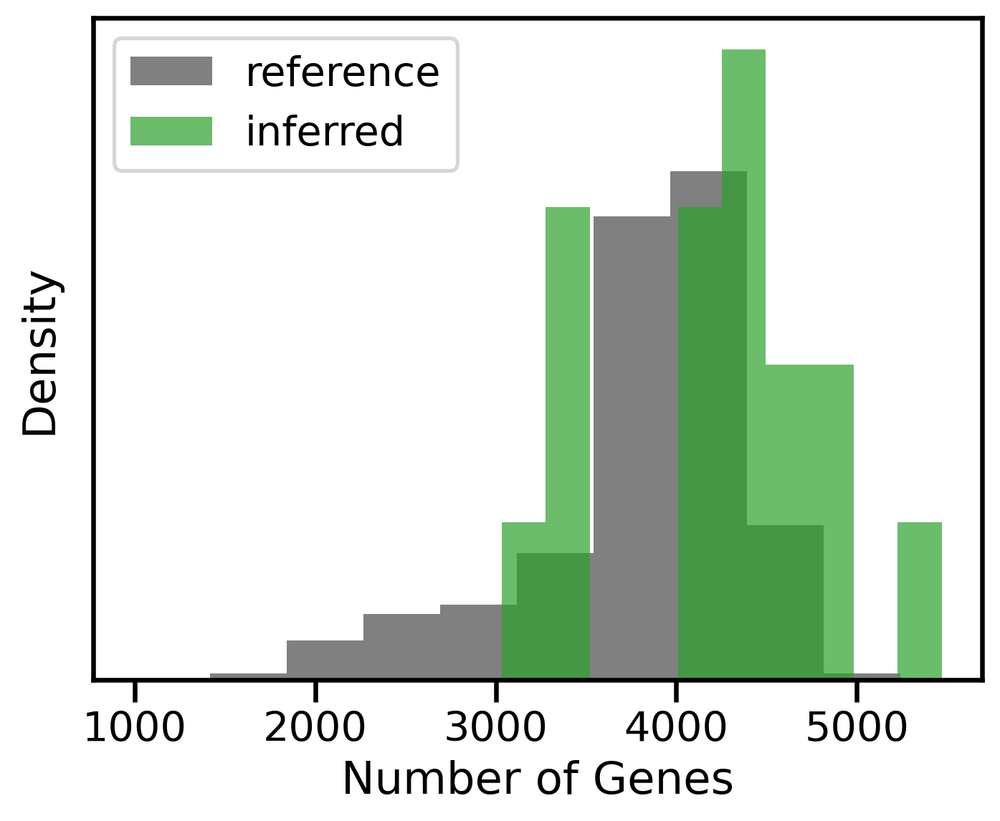

In [787]:
bins = None #np.linspace(0, 1e4, num=21)

plt.hist((reference_gene > 0).sum(), density=True, bins=bins, label='reference', color='grey')
# plt.hist(moderate_hit[high_power_strain_list].sum(), density=True, bins=bins, alpha=0.7, label='moderate-confidence')
plt.hist(high_confidence_hit[high_power_strain_list].sum(), density=True, bins=bins, alpha=0.7, label='inferred', color='tab:green')
# plt.hist(strict_corr_hit[high_power_strain_list].sum(), density=True, bins=bins, histtype='step', lw=2, label='strict-corr-only')
# plt.hist(lenient_corr_hit[high_power_strain_list].sum(), density=True, bins=bins, histtype='step', lw=2, label='lenient-corr-only')
# plt.hist(depth_hit[high_power_strain_list].sum(), density=True, bins=bins, histtype='step', lw=2, label='depth-only')

plt.legend()
plt.ylabel("Density")
plt.yticks([])
plt.xlabel("Number of Genes")
None

In [74]:
reference_gene.shape

(82169, 8288)

In [75]:
(
    len(set(idxwhere((reference_gene > 0).mean(1) > 0.8)) & set(idxwhere(high_confidence_hit[high_power_strain_list].mean(1) > 0.8))),
    len(set(idxwhere((isolate_gene > 0).mean(1) > 0.8)) & set(idxwhere(high_confidence_hit[high_power_strain_list].mean(1) > 0.8))),
)

(2337, 2331)

In [76]:
(
    len(set(idxwhere(high_confidence_hit[high_power_strain_list].mean(1) > 0.8)) - set(idxwhere((reference_gene > 0).mean(1) > 0.8))),
    len(set(idxwhere(high_confidence_hit[high_power_strain_list].mean(1) > 0.8)) - set(idxwhere((isolate_gene > 0).mean(1) > 0.8))),
)

(294, 300)

In [77]:
(
    len(set(idxwhere((reference_gene > 0).mean(1) > 0.8)) - set(idxwhere(high_confidence_hit[high_power_strain_list].mean(1) > 0.8))),
    len(set(idxwhere((isolate_gene > 0).mean(1) > 0.8)) - set(idxwhere(high_confidence_hit[high_power_strain_list].mean(1) > 0.8))),
)

(604, 775)

r: 0.9223881712111274
RMSE: 0.0753639124304908


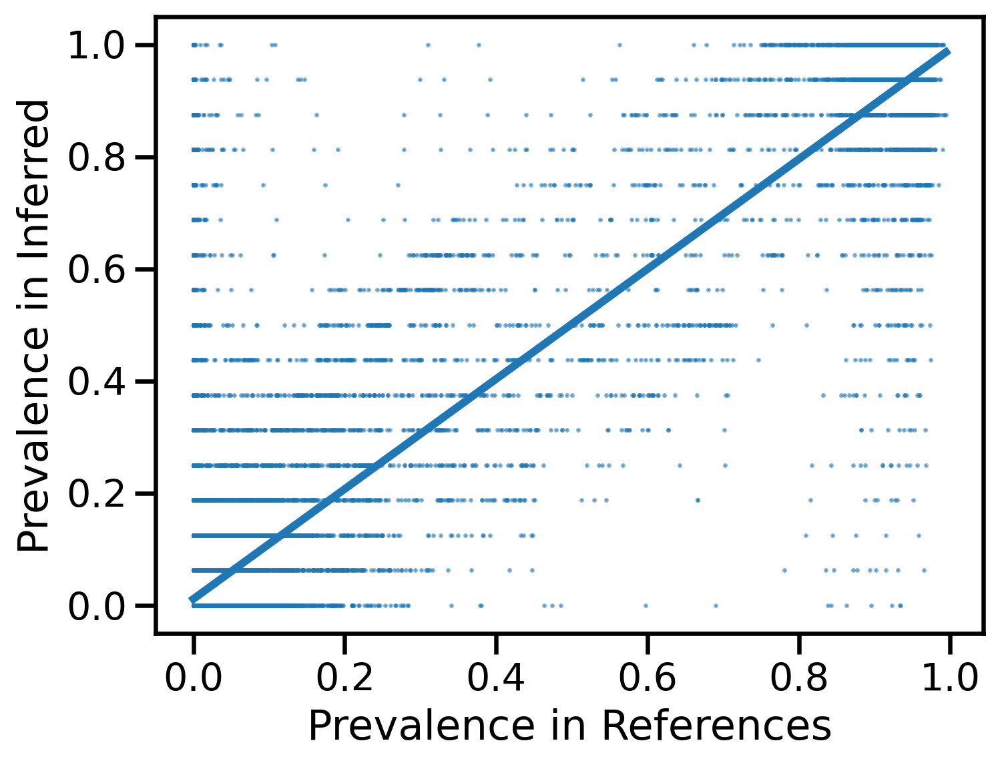

In [110]:
x = (reference_gene > 0).mean(1)
y = moderate_hit[high_power_strain_list].mean(1)

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=0)
y = y.reindex(_all_genes, fill_value=0)

sns.regplot(x=x, y=y, scatter_kws=dict(s=1, alpha=0.5))
plt.xlabel('Prevalence in References')
plt.ylabel('Prevalence in Inferred')

print('r:', sp.stats.pearsonr(x, y)[0])
print('RMSE:', np.sqrt(((x - y)**2).mean()))

In [ ]:
x = (reference_gene > 0).mean(1)
y = high_confidence_hit[high_power_strain_list].mean(1)

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=0)
y = y.reindex(_all_genes, fill_value=0)

sns.regplot(x=x, y=y, scatter_kws=dict(s=1, alpha=0.5))
plt.xlabel('Prevalence in References')
plt.ylabel('Prevalence in Inferred')

print('r:', sp.stats.pearsonr(x, y)[0])
print('RMSE:', np.sqrt(((x - y)**2).mean()))

In [ ]:
x = (reference_gene > 0).mean(1)
y = maybe_hit[high_power_strain_list].mean(1)

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=0)
y = y.reindex(_all_genes, fill_value=0)

sns.regplot(x, y, scatter_kws=dict(s=1, alpha=0.5))
plt.xlabel('Prevalence in References')
plt.ylabel('Prevalence in Inferred')

print('r:', sp.stats.pearsonr(x, y)[0])
print('RMSE:', np.sqrt(((x - y)**2).mean()))

In [ ]:
x = (isolate_gene > 0).mean(1)
y = moderate_hit[high_power_strain_list].mean(1)

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=0)
y = y.reindex(_all_genes, fill_value=0)

sns.regplot(x, y, scatter_kws=dict(s=1, alpha=0.5))
plt.xlabel('Prevalence in References')
plt.ylabel('Prevalence in Inferred')

print('r:', sp.stats.pearsonr(x, y)[0])
print('RMSE:', np.sqrt(((x - y)**2).mean()))

In [ ]:
x = (reference_gene > 0).mean(1)
y = strict_corr_hit[high_power_strain_list].mean(1)

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=0)
y = y.reindex(_all_genes, fill_value=0)

sns.regplot(x, y, scatter_kws=dict(s=1, alpha=0.5))
plt.xlabel('Prevalence in References')
plt.ylabel('Prevalence in Inferred')

print('r:', sp.stats.pearsonr(x, y)[0])
print('RMSE:', np.sqrt(((x - y)**2).mean()))

In [ ]:
x = (reference_gene > 0).mean(1)
y = depth_hit[high_power_strain_list].mean(1)

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=0)
y = y.reindex(_all_genes, fill_value=0)

sns.regplot(x, y, scatter_kws=dict(s=1, alpha=0.5))
plt.xlabel('Prevalence in References')
plt.ylabel('Prevalence in Inferred')

print('r:', sp.stats.pearsonr(x, y)[0])
print('RMSE:', np.sqrt(((x - y)**2).mean()))

In [ ]:
x = (reference_gene > 0)
y = strict_corr_hit

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=False)
y = y.reindex(_all_genes, fill_value=False)

jac_cdist_inf2 = pd.DataFrame(sp.spatial.distance.cdist(x.T, y.T, metric='jaccard'), index=x.columns, columns=y.columns)

In [ ]:
x = (reference_gene > 0)
y = depth_hit

_all_genes = list(set(x.index) | set(y.index))

x = x.reindex(_all_genes, fill_value=False)
y = y.reindex(_all_genes, fill_value=False)

jac_cdist_inf3 = pd.DataFrame(sp.spatial.distance.cdist(x.T, y.T, metric='jaccard'), index=x.columns, columns=y.columns)

In [ ]:
x = (reference_gene > 0)

u, v = x[jac_cdist_inf.idxmin().to_list()], x.drop(jac_cdist_inf.idxmin().to_list(), axis='columns')

jac_cdist_ref = pd.DataFrame(sp.spatial.distance.cdist(u.T, v.T, metric='jaccard'), index=u.columns, columns=v.columns).T

In [ ]:
bins = np.linspace(0, 1, num=51)
for strain in highest_power_strain_list:
    plt.hist(jac_cdist_inf[strain], bins=bins, label=strain, alpha=0.5)
plt.legend()
plt.xlabel('Jaccard Distance to Reference')

None

In [ ]:
d = strain_meta.join(high_confidence_diff.apply(lambda x: x.value_counts()).T).assign(**dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
))

# d = strain_meta.join(high_confidence_diff.apply(lambda x: x.value_counts()).T)

fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize=(10, 6))

axs[0].set_yscale('log')

mappable = axs[0].scatter('conf_hit_min_dist', 'only_inf', data=d, c='power_index', norm=mpl.colors.PowerNorm(1/3))
mappable = axs[1].scatter('conf_hit_min_dist', 'only_ref', data=d, c='power_index', norm=mpl.colors.PowerNorm(1/3))
mappable = axs[2].scatter('conf_hit_min_dist', 'shared_genes', data=d, c='power_index', norm=mpl.colors.PowerNorm(1/3))

plt.colorbar(mappable, ax=axs)
# axs[1].set_xscale('log')

In [ ]:
d = strain_meta.join(moderate_diff.apply(lambda x: x.value_counts()).T).assign(**dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    mod_hit_mind_dist=jac_cdist_inf4.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
))

# d = strain_meta.join(high_confidence_diff.apply(lambda x: x.value_counts()).T)

fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(12, 8))

for (feat, norm), ax in zip([
    ('power_index', mpl.colors.PowerNorm(1/3)),
    ('corr_threshold_strict', mpl.colors.PowerNorm(1.)),
    ('genotype_entropy', mpl.colors.PowerNorm(1.)),
    ('num_samples', mpl.colors.LogNorm(vmin=1)),
], axs.flatten()):
    ax.set_title(feat)
    mappable = ax.scatter('only_ref', 'only_inf', data=d, c=feat, norm=norm, s=10)
    fig.colorbar(mappable, ax=ax)
    ax.plot([0, 1e4], [0, 1e4], lw=1, linestyle='--', color='k')

axs[0, 0].set_xscale('log')
axs[0, 0].set_yscale('log')
# axs[1].set_xscale('log')

In [ ]:
bins = np.linspace(0, 1, num=21)
plt.hist(jac_cdist_ref.min(), bins=bins, alpha=0.5, label='reference', density=True, histtype='step', lw=2)
plt.hist(jac_cdist_inf.min(), bins=bins, alpha=0.5, label='high confidence', density=True, histtype='stepfilled', lw=2)
plt.hist(jac_cdist_inf4.min(), bins=bins, alpha=0.5, label='moderate confidence', density=True, histtype='stepfilled', lw=2)
plt.hist(jac_cdist_inf2.min(), bins=bins, alpha=0.5, label='corr-only', density=True, histtype='step', lw=2)
plt.hist(jac_cdist_inf3.min(), bins=bins, alpha=0.5, label='depth-only', density=True, histtype='step', lw=2)
plt.legend(bbox_to_anchor=(1, 1))

plt.xlabel('Minimum Jaccard Distance')

In [ ]:
bins = np.linspace(0, 1, num=21)
plt.hist(jac_cdist_ref.min(), bins=bins, alpha=0.5, label='reference', density=True, histtype='step', lw=2)
plt.hist(jac_cdist_inf[high_power_strain_list].min(), bins=bins, alpha=0.5, label='high confidence', density=True, histtype='stepfilled', lw=2)
plt.hist(jac_cdist_inf4[high_power_strain_list].min(), bins=bins, alpha=0.5, label='moderate confidence', density=True, histtype='stepfilled', lw=2)
plt.hist(jac_cdist_inf2[high_power_strain_list].min(), bins=bins, alpha=0.5, label='corr-only', density=True, histtype='step', lw=2)
plt.hist(jac_cdist_inf3[high_power_strain_list].min(), bins=bins, alpha=0.5, label='depth-only', density=True, histtype='step', lw=2)
plt.legend(bbox_to_anchor=(1, 1))

plt.xlabel('Minimum Jaccard Distance')

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

for c in ['num_samples', 'power_index', 'depth_sum', 'depth_max', 'depth_stdev', 'genotype_entropy', 'metagenotype_entropy']:
    plt.figure()
    plt.scatter('corr_hit_min_dist', 'depth_hit_min_dist', data=d, c=c, norm=mpl.colors.PowerNorm(1/3))
    plt.colorbar(label=c)
    plt.plot([0, 1.0], [0, 1.0])

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

    
plt.figure()
plt.scatter(d['num_samples'], d['corr_hit_min_dist'], c=d['power_index'])
plt.xscale('log')
print(sp.stats.spearmanr(d['num_samples'], d['corr_hit_min_dist']))

plt.xlabel('Number of Strain Samples')
plt.ylabel('Minimum Jaccard\nDistance to Reference')

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

    
plt.figure()
plt.scatter(d['num_samples'], d['depth_hit_min_dist'], c=d['power_index'])
plt.xscale('log')
sp.stats.spearmanr(d['num_samples'], d['depth_hit_min_dist'])

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

    
plt.figure()
plt.scatter(d['num_samples'], d['conf_hit_min_dist'], c=d['power_index'])
plt.xscale('log')
print(sp.stats.spearmanr(d['num_samples'], d['conf_hit_min_dist']))

plt.xlabel('Number of Strain Samples')
plt.ylabel('Minimum Jaccard\nDistance to Reference')

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

plt.scatter(d.num_samples, d.depth_hit_min_dist - d.corr_hit_min_dist, c=d['power_index'])

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

for c in ['num_samples', 'power_index', 'depth_sum', 'depth_max', 'depth_stdev', 'genotype_entropy', 'metagenotype_entropy']:
    plt.figure()
    plt.scatter('conf_hit_min_dist', 'depth_hit_min_dist', data=d, c=c, norm=mpl.colors.PowerNorm(1/3))
    plt.colorbar(label=c)
    plt.plot([0, 1.0], [0, 1.0])

In [ ]:
d = pd.DataFrame(dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    # med_conf_hit_min_dist=jac_cdist_inf4.min(),
)).join(strain_meta)

for c in ['num_samples', 'power_index', 'depth_sum', 'depth_max', 'depth_stdev', 'genotype_entropy', 'metagenotype_entropy']:
    plt.figure()
    plt.scatter('conf_hit_min_dist', 'corr_hit_min_dist', data=d, c=c, norm=mpl.colors.PowerNorm(1/3))
    plt.colorbar(label=c)
    plt.plot([0, 1.0], [0, 1.0])

In [ ]:
depth_diff = pd.DataFrame(x[jac_cdist_inf3.idxmin()].values * 2 - y[jac_cdist_inf3.columns].values * 3, index=x.index, columns=y.columns).replace({-3: 'only_inf', -1: 'shared_genes', 0: 'both_lacking', 2: 'only_ref'})
depth_diff.apply(lambda x: x.value_counts())[high_power_strain_list]

In [ ]:
d = strain_meta.join(depth_diff.apply(lambda x: x.value_counts()).T).assign(**dict(
    conf_hit_min_dist=jac_cdist_inf.min(),
    corr_hit_min_dist=jac_cdist_inf2.min(),
    depth_hit_min_dist=jac_cdist_inf3.min(),
))

# d = strain_meta.join(depth_diff.apply(lambda x: x.value_counts()).T)

fig, axs = plt.subplots(3, sharex=True, sharey=True, figsize=(10, 6))

axs[0].set_yscale('log')

mappable = axs[0].scatter('depth_hit_min_dist', 'only_inf', data=d, c='num_samples', norm=mpl.colors.PowerNorm(1/3))
mappable = axs[1].scatter('depth_hit_min_dist', 'only_ref', data=d, c='num_samples', norm=mpl.colors.PowerNorm(1/3))
mappable = axs[2].scatter('depth_hit_min_dist', 'shared_genes', data=d, c='num_samples', norm=mpl.colors.PowerNorm(1/3))

plt.colorbar(mappable, ax=axs)
# axs[1].set_xscale('log')

In [ ]:
d = (
    moderate_diff
    .loc[:, strain_meta.power_index > 2]
    .rename_axis(index='gene_id')
    .stack()
    [lambda x: x != 'both_lacking']
    .to_frame('match')
    .join(
        strain_depth
        .loc[:, strain_meta.power_index > 2]
        .stack()
        .rename('depth')
    )
    .reset_index()
)
fig, ax = plt.subplots(figsize=(20, 5))
sns.stripplot(y='depth', x='strain', hue='match', data=d, ax=ax, dodge=True, alpha=0.1)
ax.set_yscale('symlog', linthresh=1e-3)
ax.set_ylim(0)

In [ ]:
plt.hist(strain_depth[high_confidence_hit].sum()[high_power_strain_list], bins=10)
None

In [200]:
strain_list = high_power_strain_list


any_high_confidence_hit = (high_confidence_hit[strain_list].sum(1) > 0).pipe(idxwhere)

multiple_high_depth_hit = ((high_depth & moderate_corr_hit).loc[any_high_confidence_hit, strain_list].sum(1) > 1).pipe(idxwhere)
single_strain_hit = (moderate_corr_hit.loc[any_high_confidence_hit, strain_list].sum(1) == 1).pipe(idxwhere)
multiple_strain_gene_hits = ((depth_hit & moderate_corr_hit).loc[any_high_confidence_hit, strain_list].sum(1) > 1).pipe(idxwhere)
prevalent_gene_hits = ((depth_hit & moderate_corr_hit).loc[any_high_confidence_hit, strain_list].mean(1) > 0.8).pipe(idxwhere)
variable_strain_gene_hits = list(set(multiple_strain_gene_hits) - set(prevalent_gene_hits))
other_hit_genes = list(
    set(any_high_confidence_hit)
    - set(chain.from_iterable([single_strain_hit, prevalent_gene_hits, variable_strain_gene_hits]))
)

for (nameA, setA), (nameB, setB) in combinations(dict(
    # any_high_confidence_hit=any_high_confidence_hit,
    multiple_high_depth_hit=multiple_high_depth_hit,
    single_strain_hit=single_strain_hit,
    # multiple_strain_gene_hits=multiple_strain_gene_hits,
    prevalent_gene_hits=prevalent_gene_hits,
    variable_strain_gene_hits=variable_strain_gene_hits,
    other_hit_genes=other_hit_genes,
).items(), r=2):
    print(nameA, nameB, len(setA), len(setB), len(set(setA) & set(setB)))

multiple_high_depth_hit single_strain_hit 1081 2463 0
multiple_high_depth_hit prevalent_gene_hits 1081 3050 394
multiple_high_depth_hit variable_strain_gene_hits 1081 4765 687
multiple_high_depth_hit other_hit_genes 1081 2103 0
single_strain_hit prevalent_gene_hits 2463 3050 0
single_strain_hit variable_strain_gene_hits 2463 4765 0
single_strain_hit other_hit_genes 2463 2103 0
prevalent_gene_hits variable_strain_gene_hits 3050 4765 0
prevalent_gene_hits other_hit_genes 3050 2103 0
variable_strain_gene_hits other_hit_genes 4765 2103 0


In [567]:
d.sum(1).min()

0.0

Text(2335.960297241211, 0.5, 'Gene Family')

In [585]:
len(high_power_strain_list)

16

12381


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


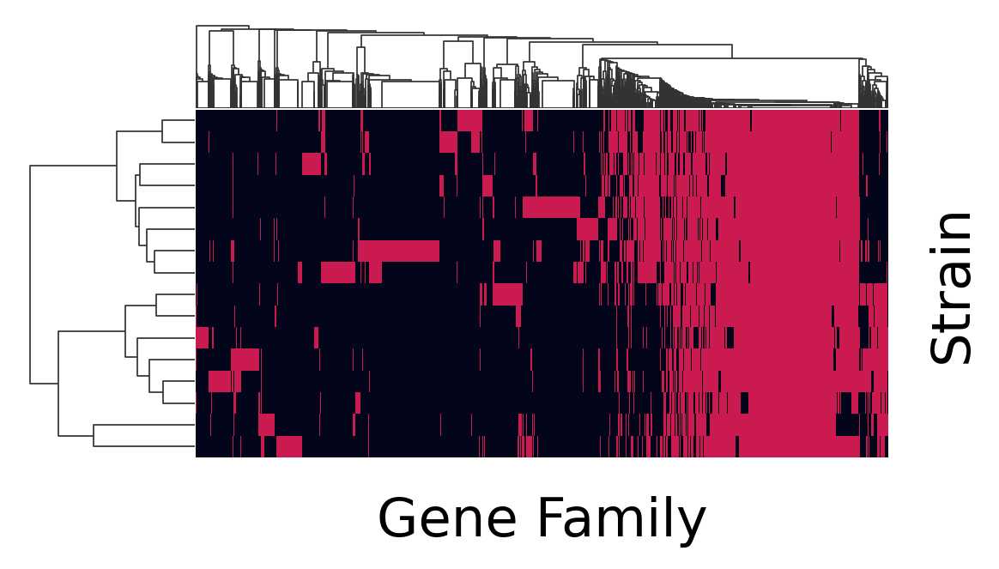

In [588]:
strain_list = high_power_strain_list
genes_list = idxwhere(high_confidence_hit[strain_list].sum(1) > 0)
d = moderate_hit.astype(float).loc[genes_list, strain_list]
print(d.shape[0])
if len(genes_list) < 3e4:
    cg = sns.clustermap(
        d.T,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=0,
        xticklabels=0,
        row_linkage=fit.genotype.sel(strain=strain_list).linkage("strain"),
        cbar_kws=dict(orientation='horizontal', visible=False),
        cbar_pos=None,  #(0.05, 0.95, 0.2, 0.05),
        figsize=(5, 3),
    )
    cg.ax_heatmap.set_xlabel('Gene Family')
    cg.ax_heatmap.set_ylabel('Strain')
else:
    print("Too many genes for clustermap:", len(genes_list))
    


2463


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


3050


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


4765


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


2103


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


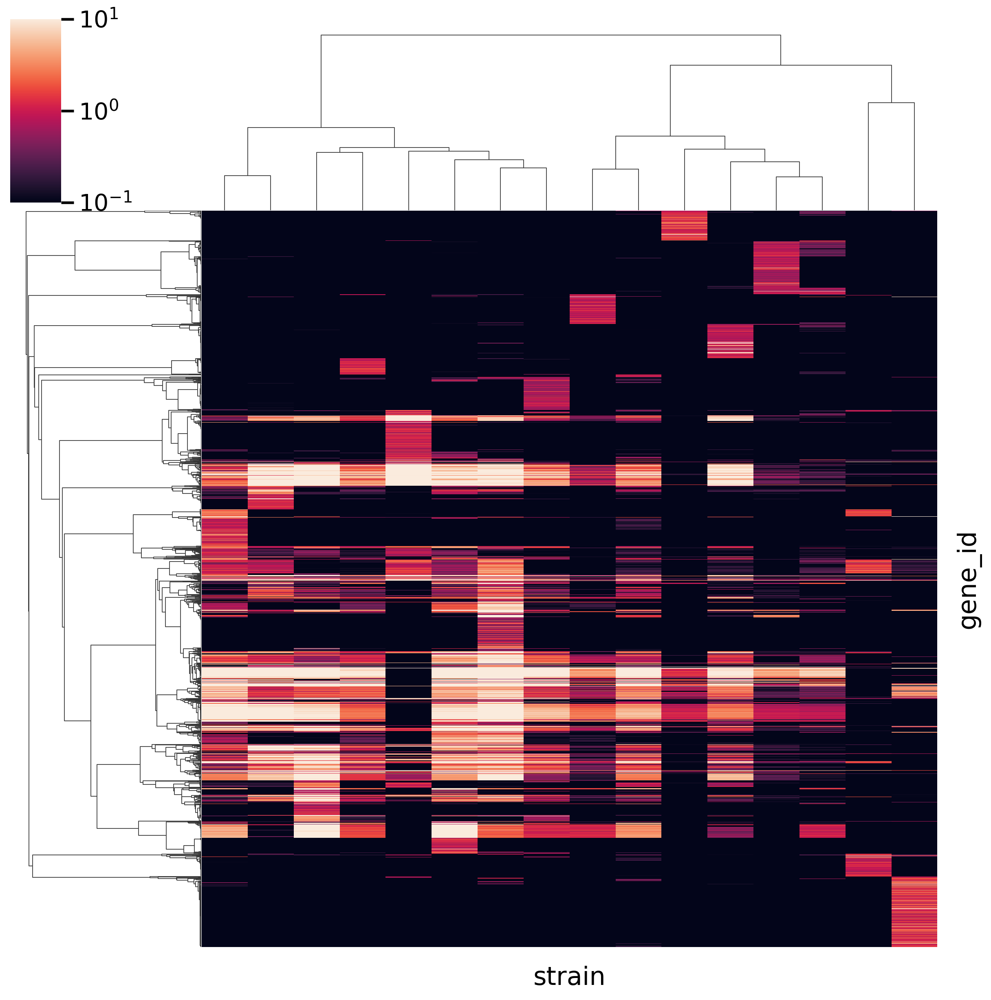

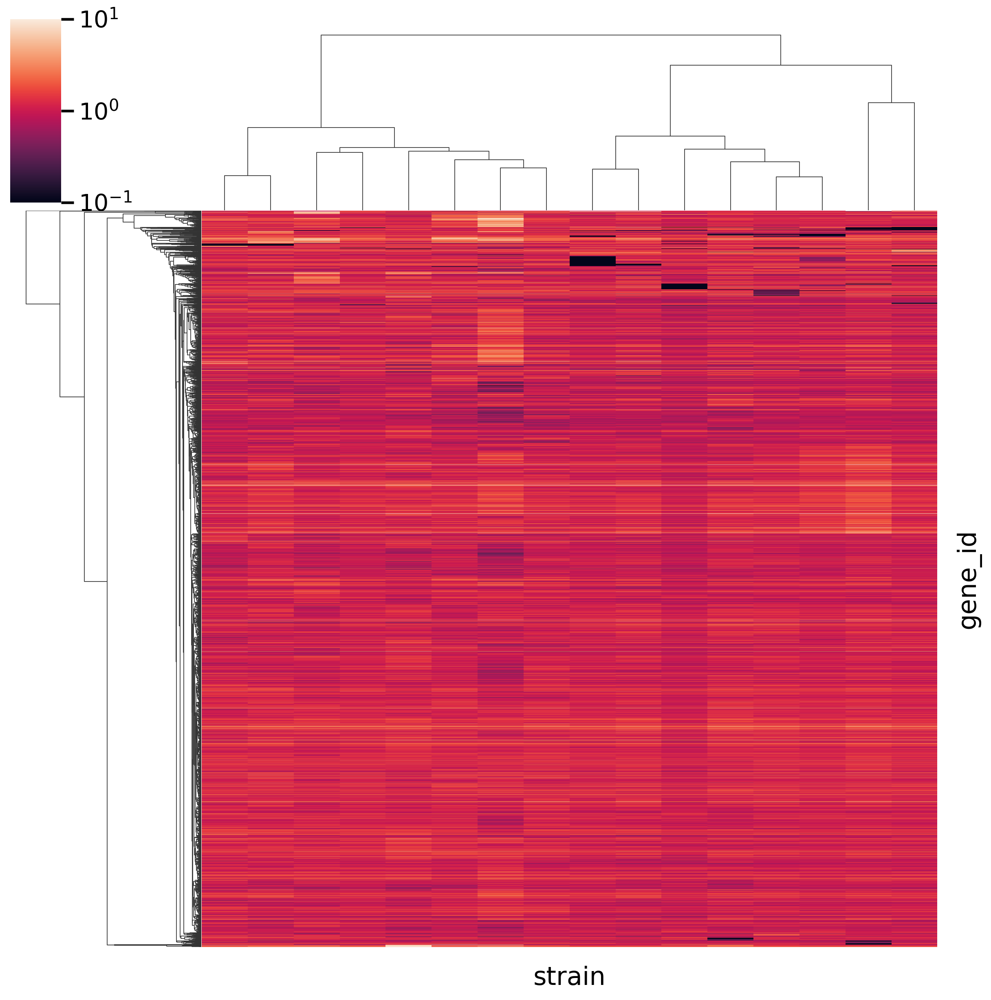

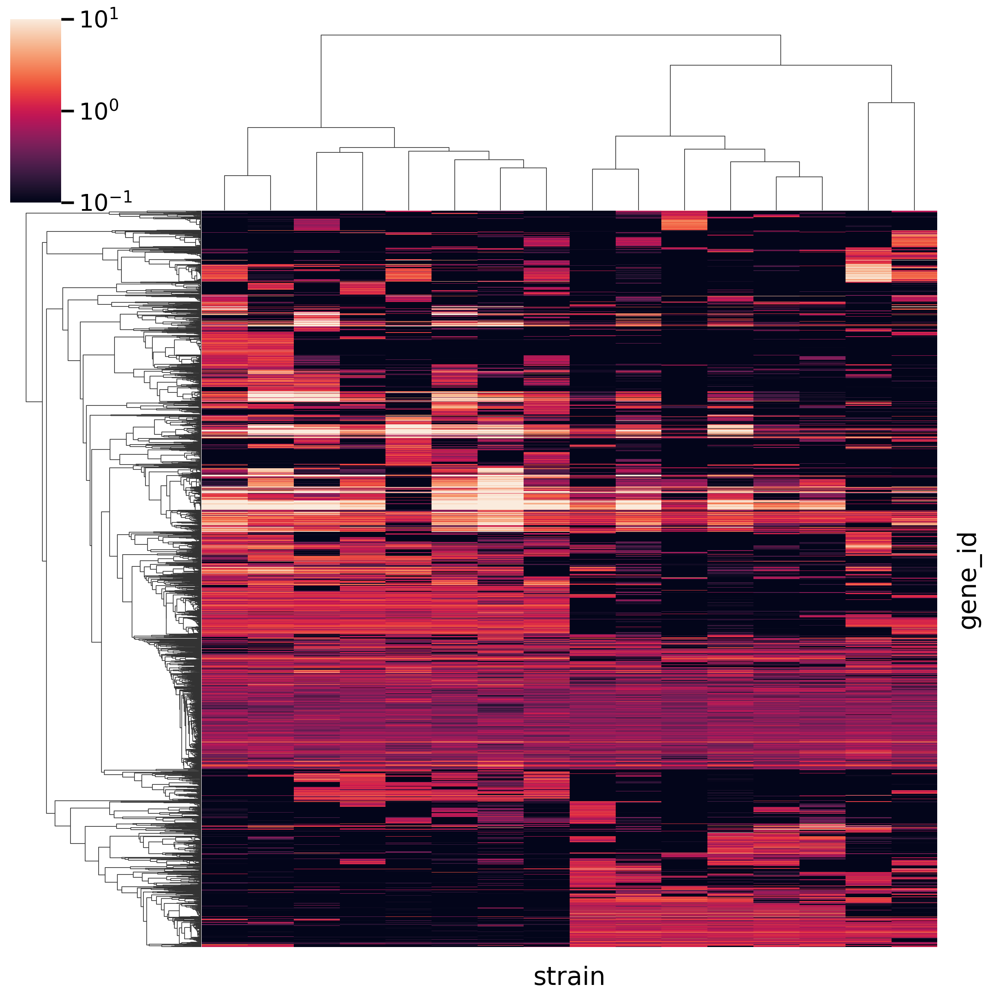

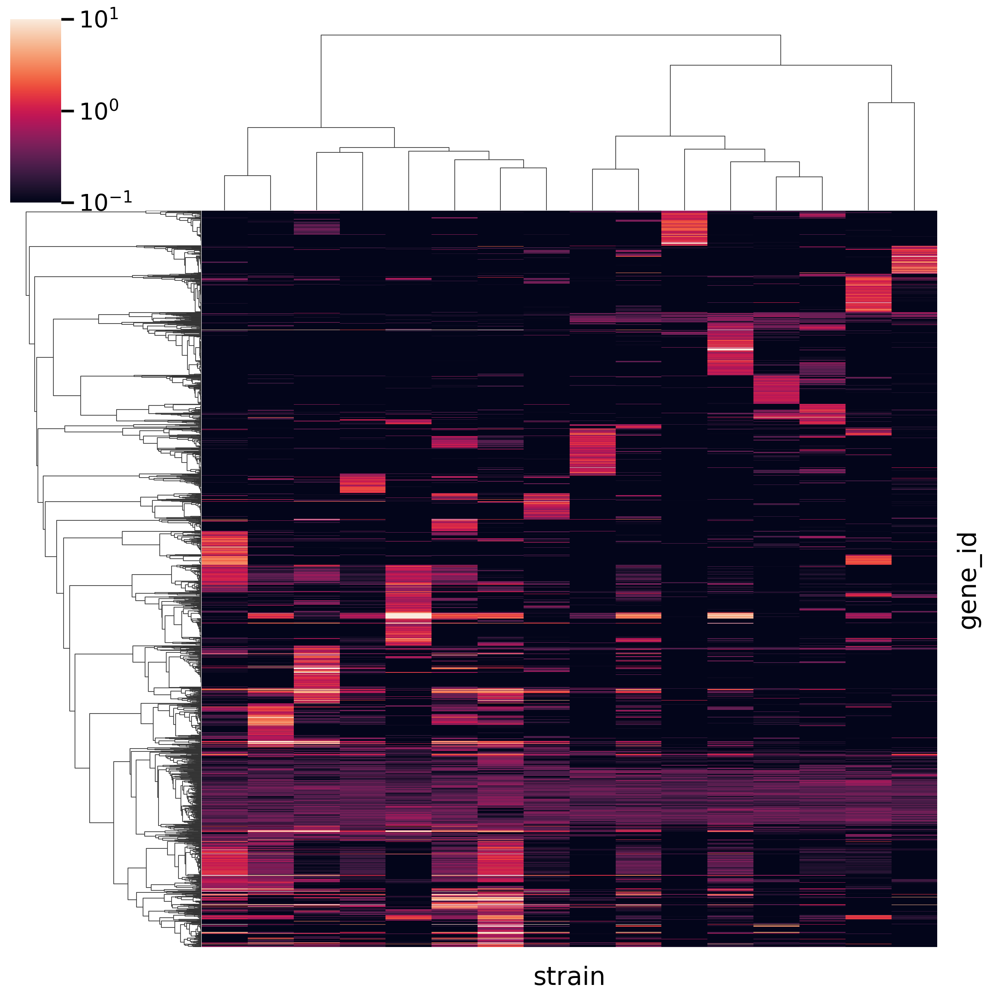

In [203]:
strain_list = high_power_strain_list

# genes_list = idxwhere((high_confidence_hit[strain_list].sum(1) > 0))
d = strain_depth.loc[genes_list, strain_list]

for genes_list in [single_strain_hit, prevalent_gene_hits, variable_strain_gene_hits, other_hit_genes]:
    d = strain_depth.loc[genes_list, strain_list]
    print(d.shape[0])
    if len(genes_list) < 2e4:
        sns.clustermap(
            d,
            metric='cosine',
            norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
            yticklabels=0,
            xticklabels=0,
            col_linkage=fit.genotype.sel(strain=strain_list).linkage("strain"),
        )
    else:
        print("Too many genes for clustermap:", len(genes_list))

In [206]:
assert len(set(prevalent_gene_hits) & set(variable_strain_gene_hits)) == 0

In [622]:
prevalent_gene_categories = pd.merge(
    gene_annotation.loc[prevalent_gene_hits].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts()

variable_gene_categories = pd.merge(
    gene_annotation.loc[variable_strain_gene_hits].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts()

gene_type_category_counts = pd.DataFrame(dict(core=prevalent_gene_categories, variable=variable_gene_categories)).fillna(0).astype(int).join(cog_category)
gene_type_category_counts.assign(log_ratio_of_ratios=lambda x: np.log2((x.variable / x.variable.sum()) / (x.core / x.core.sum()))).sort_values('log_ratio_of_ratios')

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


,core,variable,description,log_ratio_of_ratios
A,1,0,RNA processing and modification,-inf
H,104,29,Coenzyme transport and metabolism,-0.952470
S,25,7,Function unknown,-0.946512
T,100,29,Signal transduction mechanisms,-0.895886
J,133,47,"Translation, ribosomal structure and biogenesis",-0.610705
E,191,71,Amino acid transport and metabolism,-0.537693
D,24,9,"Cell cycle control, cell division, chromosome ...",-0.525049
M,146,58,Cell wall/membrane/envelope biogenesis,-0.441855
R,88,35,General function prediction only,-0.440160
I,70,29,Lipid transport and metabolism,-0.381313


['Coenzyme transport and metabolism',
 'Function unknown',
 'Signal transduction mechanisms',
 'Translation, ribosomal structure and biogenesis',
 'Amino acid transport and metabolism',
 'Cell cycle control, cell division, chromosome partitioning',
 'Cell wall/membrane/envelope biogenesis',
 'General function prediction only',
 'Lipid transport and metabolism',
 'Nucleotide transport and metabolism',
 'Energy production and conversion',
 'Post-translational modification, protein turnover, and chaperones',
 'Inorganic ion transport and metabolism',
 'Transcription',
 'Replication, recombination and repair',
 'Carbohydrate transport and metabolism',
 'Secondary metabolites biosynthesis, transport, and catabolism',
 'Defense mechanisms',
 'Intracellular trafficking, secretion, and vesicular transport',
 'Cell motility',
 'Extracellular structures',
 'Mobilome: prophages, transposons']

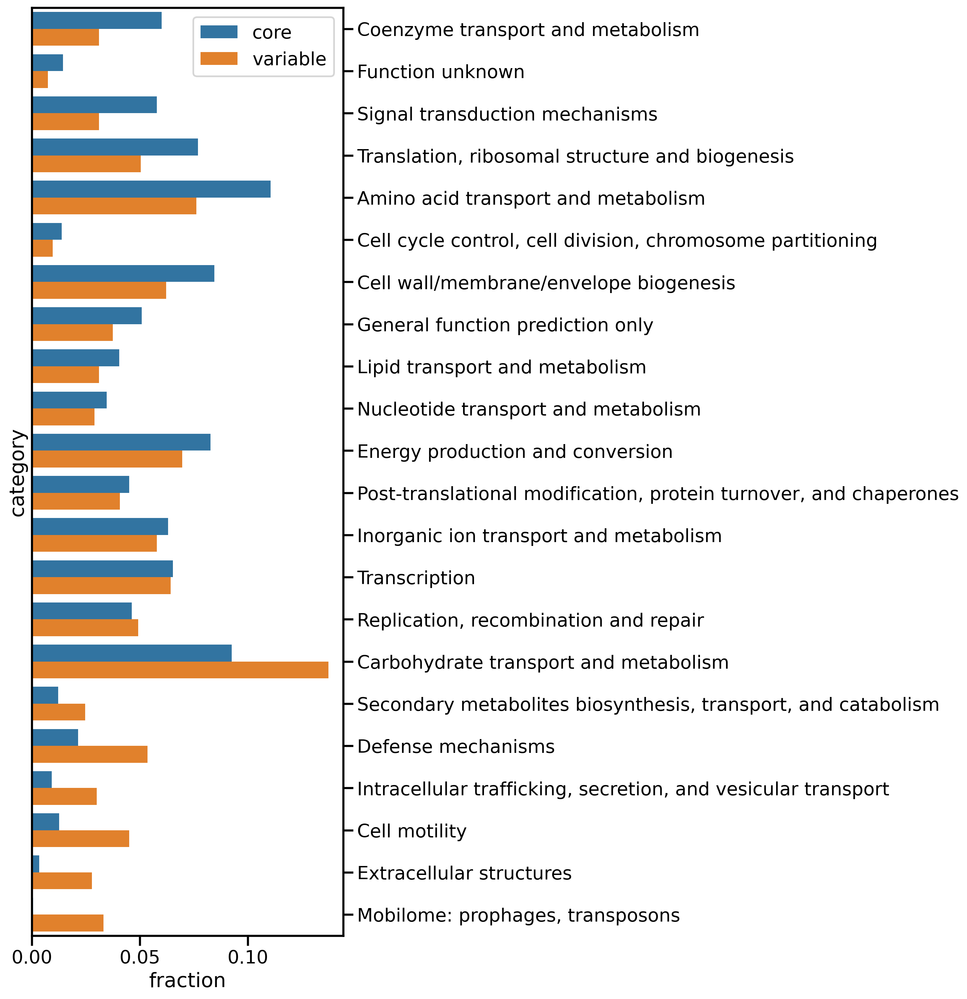

In [716]:
d0 = gene_type_category_counts.drop(['A', 'Z'])

category_order = d0.assign(log_ratio_of_ratios=lambda x: np.log2((x.variable / x.variable.sum()) / (x.core / x.core.sum()))).sort_values('log_ratio_of_ratios').index

d1 = d0[['core', 'variable']].pipe(lambda d: d / d.sum()).unstack().rename_axis(index=['core_or_variable', 'category']).rename('fraction').reset_index()

fig, ax = plt.subplots(figsize=(5, 15))
sns.barplot(data=d1, x='fraction', y='category', hue='core_or_variable', orientation='horizontal', order=category_order, palette={'core': 'tab:blue', 'variable': 'tab:orange'}, ax=ax)
ax.set_yticklabels([cog_category.loc[t.get_text()].description for t in ax.get_ymajorticklabels()])
ax.yaxis.tick_right()
# ax.legend_.set_visible(False)
ax.legend(bbox_to_anchor=(1, 1))
# ax.set_xscale('log')
# lib.plot.rotate_yticklabels(ax=ax)

In [707]:
from statsmodels.stats.multitest import fdrcorrection

In [713]:
d0 = gene_type_category_counts[['core', 'variable']]

core_total_count = d0.core.sum()
variable_total_count = d0.variable.sum()
pvalue = d0.apply(lambda x: sp.stats.fisher_exact([[x.core, x.variable], [core_total_count - x.core, variable_total_count - x.variable]])[1], axis=1)
pvalue.to_frame().assign(fdr=fdrcorrection(pvalue)[1]).sort_values('fdr').join(cog_category)

,0,fdr,description
X,1.180418e-13,2.833004e-12,"Mobilome: prophages, transposons"
W,9.367623e-08,1.124115e-06,Extracellular structures
N,7.749475e-07,6.199580e-06,Cell motility
V,1.730343e-05,1.038206e-04,Defense mechanisms
U,1.625361e-04,7.801732e-04,"Intracellular trafficking, secretion, and vesi..."
G,5.142438e-04,2.056975e-03,Carbohydrate transport and metabolism
H,1.024608e-03,3.512943e-03,Coenzyme transport and metabolism
T,1.766331e-03,5.298992e-03,Signal transduction mechanisms
E,4.179426e-03,1.114514e-02,Amino acid transport and metabolism
J,9.502931e-03,2.280704e-02,"Translation, ribosomal structure and biogenesis"


In [238]:
prevalent_gene_hypothetical_counts = (gene_annotation.loc[prevalent_gene_hits, 'product'] == 'hypothetical protein').value_counts()
variable_gene_hypothetical_counts = (gene_annotation.loc[variable_strain_gene_hits, 'product'] == 'hypothetical protein').value_counts()

gene_hypothetical_counts = pd.DataFrame(dict(core=prevalent_gene_hypothetical_counts, variable=variable_gene_hypothetical_counts)).fillna(0).astype(int)
gene_hypothetical_counts.assign(ratio_of_ratios=lambda x: (x.variable / x.variable.sum()) / (x.core / x.core.sum()))

,core,variable,ratio_of_ratios
False,2198,1559,0.453999
True,852,3206,2.408579


In [801]:
mpl.rcParams['figure.figsize']

[6.4, 4.8]

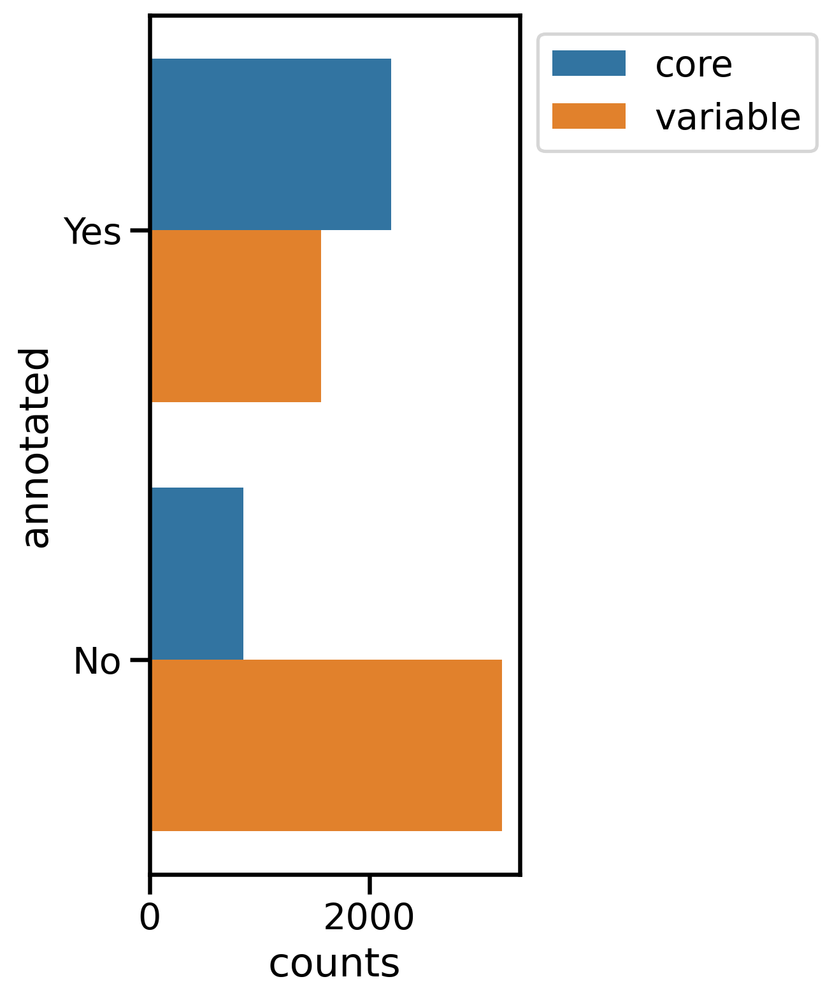

In [803]:
d = gene_hypothetical_counts.unstack().rename_axis(index=['core_or_variable', 'hypothetical']).rename('counts').reset_index().assign(annotated=lambda x: x.hypothetical.map({True: 'No', False: 'Yes'}))

fig, ax = plt.subplots(figsize=(3, 7))
sns.barplot(data=d, x='counts', y='annotated', hue='core_or_variable', orientation='horizontal', palette={'core': 'tab:blue', 'variable': 'tab:orange'}, ax=ax)
# ax.legend_.set_visible(False)
ax.legend(bbox_to_anchor=(1, 1))

sp.stats.fisher_exact(d.set_index(['core_or_variable', 'hypothetical'])['counts'].unstack())

In [809]:
d.set_index(['core_or_variable', 'hypothetical'])['counts'].unstack().apply(lambda x: x / x.sum(), axis=1)

hypothetical,False,True
core_or_variable,,
core,0.720656,0.279344
variable,0.327177,0.672823


In [816]:
np.log(((0.720656 / 0.279344) / (0.327177 / 0.672823)))

1.6686988957775302

In [445]:
hit_fraction_of_strains = high_confidence_hit[high_power_strain_list].mean(1)
moderate_hit_fraction_of_strains = moderate_hit[high_power_strain_list].mean(1)

# TODO: Calculate a phylogenetic conservation score for each.

In [461]:
genotype_distances = sp.spatial.distance.squareform(fit.genotype.pdist().loc[high_power_strain_list, high_power_strain_list])
pairwise_differences = high_confidence_hit.loc[high_confidence_hit.sum(1) > 0, high_power_strain_list].apply(lambda x: sp.spatial.distance.pdist(x[:, np.newaxis], lambda x, y: y != x), axis=1)
genetic_conservation_score = pairwise_differences.apply(lambda x: sp.stats.pearsonr(x, genotype_distances)[0])

/tmp/bsmith/ipykernel_46443/633333750.py:2: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pairwise_differences = high_confidence_hit.loc[high_confidence_hit.sum(1) > 0, high_power_strain_list].apply(lambda x: sp.spatial.distance.pdist(x[:, np.newaxis], lambda x, y: y != x), axis=1)
/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4427: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(array([5169., 3575., 1282.,  925.,  133.,  187.,   63.,  155.,   12.,
         180.]),
 array([-0.11621602, -0.01833244,  0.07955115,  0.17743473,  0.27531832,
         0.3732019 ,  0.47108549,  0.56896908,  0.66685266,  0.76473625,
         0.86261983]),
 <BarContainer object of 10 artists>)

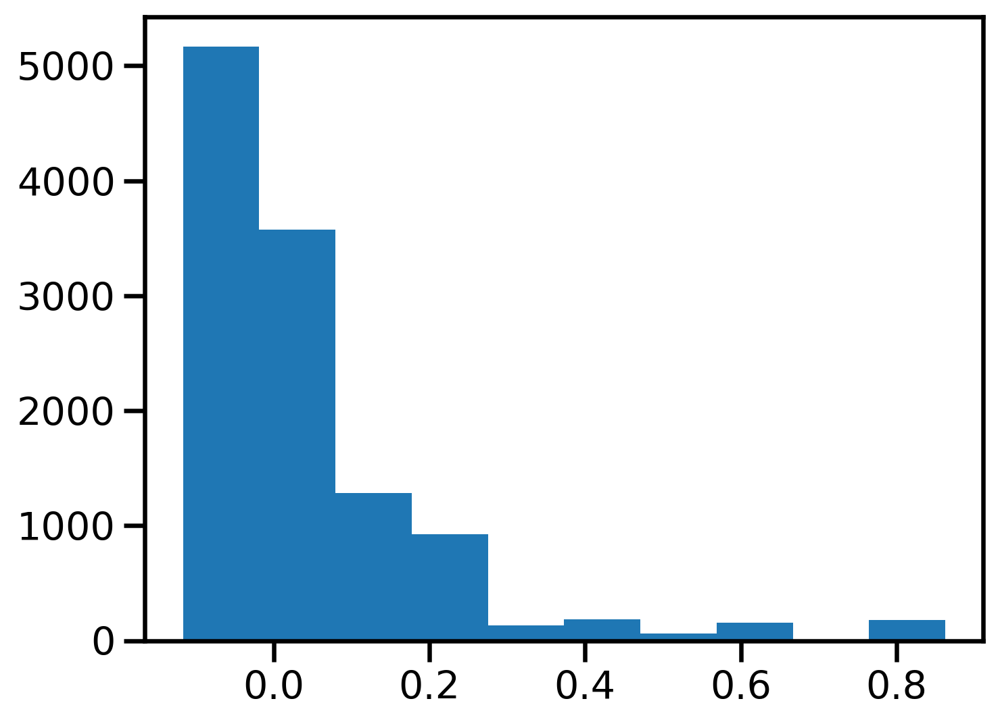

In [462]:
plt.hist(genetic_conservation_score)

405 229

TCA cycle                                      7
Glycolysis                                     4
Non-phosphorylated Entner-Doudoroff pathway    3
Fatty acid biosynthesis                        2
Serine biosynthesis                            1
NADH dehydrogenase                             1
Lysine biosynthesis                            1
NAD biosynthesis                               1
Pyridoxal phosphate biosynthesis               1
Glutamine biosynthesis                         1
Name: pathway, dtype: int64

hypothetical protein                                               176
Vitamin B12 import ATP-binding protein BtuD                          6
Outer membrane usher protein PapC                                    3
NAD/NADP-dependent betaine aldehyde dehydrogenase                    3
Inner membrane lipoprotein SadB                                      2
Toxin-antitoxin biofilm protein TabA                                 2
Oligopeptide transport ATP-binding protein Opp

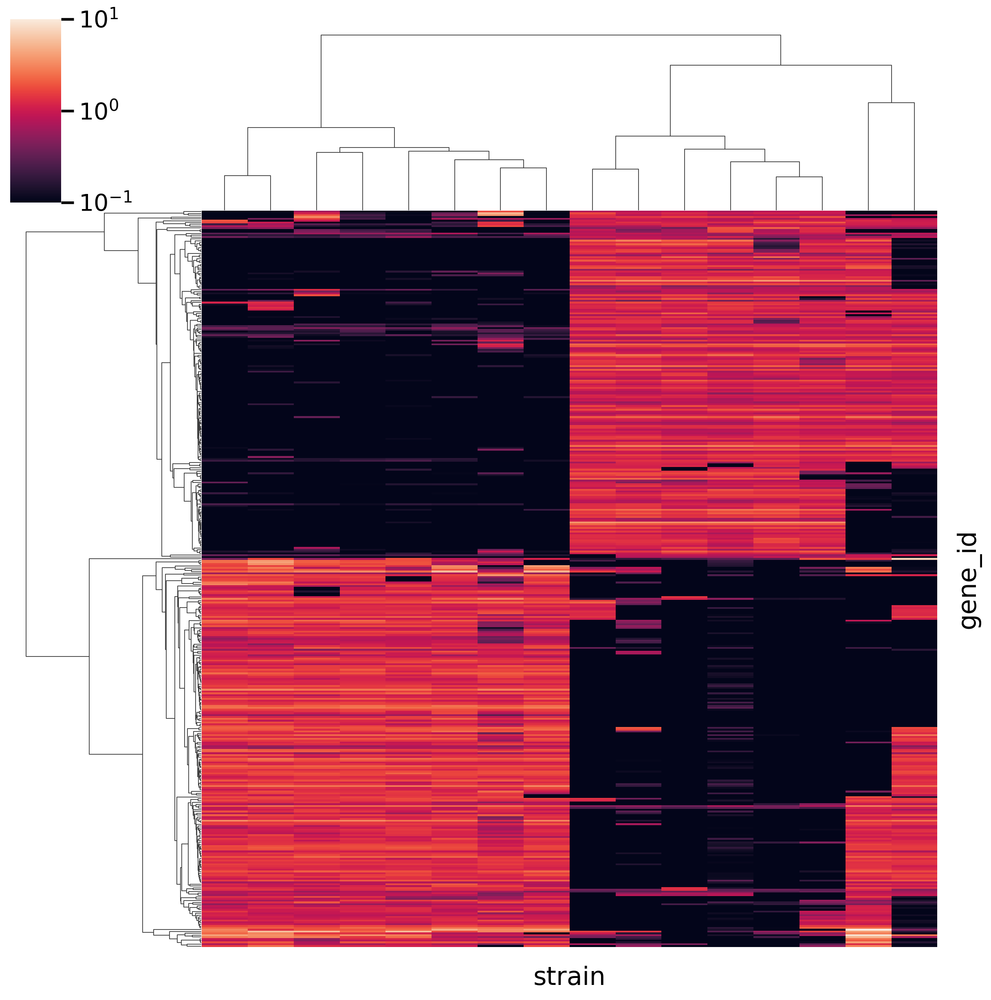

In [463]:
genes_list = idxwhere(genetic_conservation_score > 0.5)
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=0,
        xticklabels=0,
        col_linkage=fit.genotype.sel(strain=strain_list).linkage("strain"),
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


4360 1330

Ribosome 50S subunit          11
Fatty acid biosynthesis       11
Aminoacyl-tRNA synthetases     9
Glycolysis                     9
Purine biosynthesis            8
tRNA modification              6
TCA cycle                      5
Pyruvate oxidation             5
Ribosome 30S subunit           5
Arginine biosynthesis          5
Name: pathway, dtype: int64

hypothetical protein                           3030
Tyrosine recombinase XerC                        16
Prophage integrase IntA                          10
Prophage integrase IntS                           6
LexA repressor                                    6
Vitamin B12 import ATP-binding protein BtuD       6
Major exported protein                            5
Nucleoid occlusion protein                        5
Sensor histidine kinase RcsC                      4
Protein RhsD                                      4
Name: product, dtype: int64

   category                                      description
G        92         

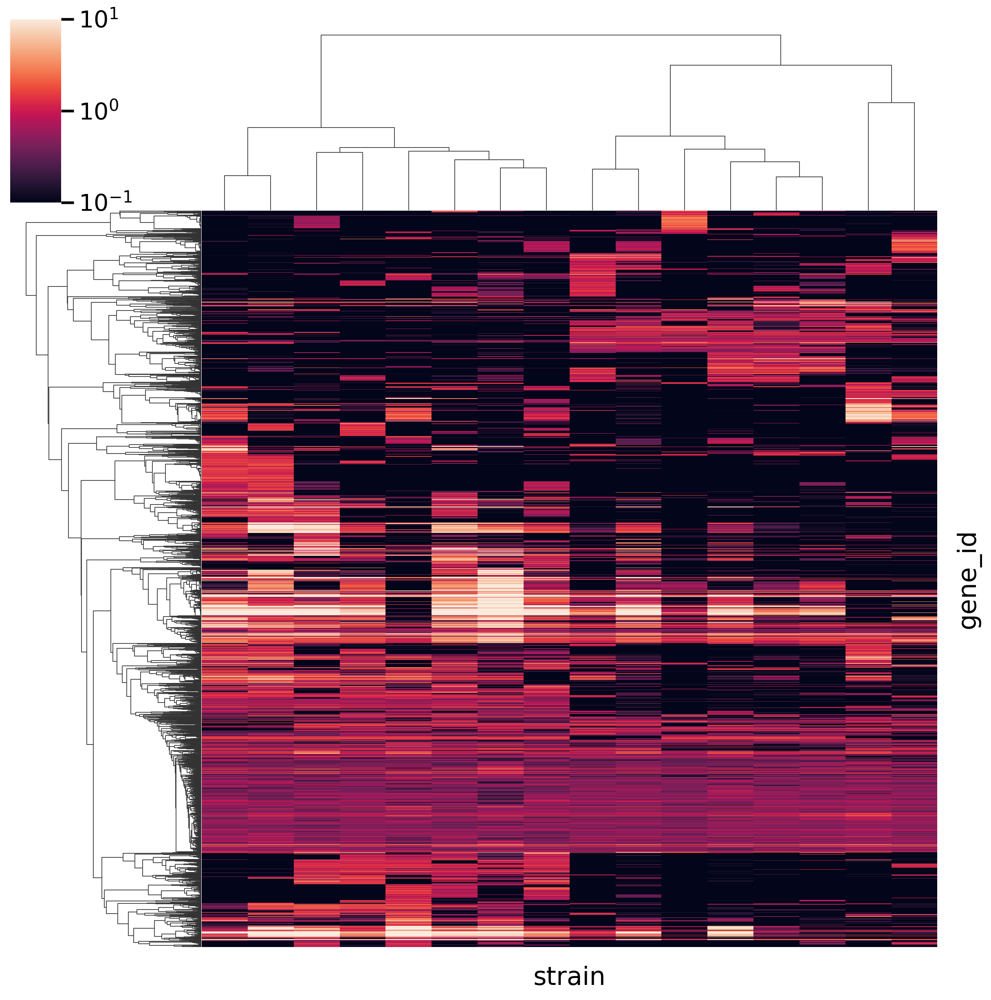

In [464]:
genes_list = list(set(variable_strain_gene_hits) & set(idxwhere(genetic_conservation_score < 0.5)))
d = strain_depth.loc[genes_list, high_power_strain_list]

if len(genes_list) < 2e4:
    sns.clustermap(
        d,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=0,
        xticklabels=0,
        col_linkage=fit.genotype.sel(strain=strain_list).linkage("strain"),
    )
else:
    print("Too many genes for clustermap:", len(genes_list))

print(len(genes_list), len(genes_list) - gene_annotation.loc[genes_list]['product'].value_counts()['hypothetical protein'])
print()
print(
    gene_annotation
    .loc[genes_list]
    .cog.to_frame()
    .join(cog_meta, on='cog')
    .pathway
    .value_counts()
    .sort_values(ascending=False)
    .head(10)
)
print()
print(
    gene_meta
    .loc[genes_list]
    ['product']
    .value_counts()
    .head(10)
)
print()
print(pd.merge(
    gene_annotation.loc[genes_list].cog.dropna().to_frame(),
    cog_x_category,
    on='cog',
).category.value_counts().to_frame().join(cog_category).head(10))

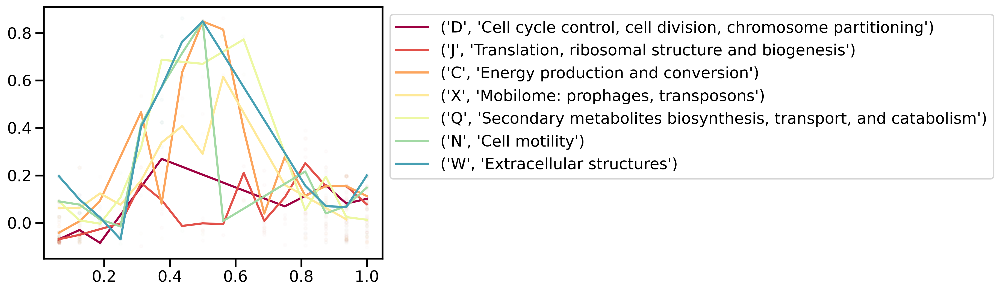

In [465]:
d0 = pd.DataFrame(dict(
    moderate_hit_fraction_of_strains=moderate_hit_fraction_of_strains,
    genetic_conservation_score=genetic_conservation_score,
)).dropna().join(gene_annotation).pipe(lambda d: pd.merge(d, cog_x_category, on='cog', how='left'))

# plt.scatter('hit_fraction_of_strains', 'genetic_conservation_score', data=d0[d0.category.isna()], alpha=0.01, s=10, color='k')

# cog_category_order = d0.groupby(['category']).genetic_conservation_score.quantile(0.8).sort_values().index
cog_category_order = ['D', 'J', 'C', 'X', 'Q', 'N', 'W']
cog_category_palette = lib.plot.construct_ordered_palette(cog_category_order)

for category in cog_category_order:
    d1 = d0[d0.category == category]
    d2 = d1.groupby('moderate_hit_fraction_of_strains').genetic_conservation_score.quantile(0.8).reset_index()
    plt.scatter(
        'moderate_hit_fraction_of_strains',
        'genetic_conservation_score',
        data=d1,
        alpha=0.01,
        s=10,
        label='__nolegend__',
        color=cog_category_palette[category],
    )
    plt.plot(
        'moderate_hit_fraction_of_strains',
        'genetic_conservation_score',
        data=d2,
        # alpha=0.01,
        # s=10,
        label=(category, cog_category.loc[category].values[0]),
        color=cog_category_palette[category],
    )
plt.legend(bbox_to_anchor=(1, 1))

In [466]:
d0 = (
    pd.DataFrame(dict(
        moderate_hit_fraction_of_strains=moderate_hit_fraction_of_strains,
        genetic_conservation_score=genetic_conservation_score,
    ))
    .dropna()
    # [lambda x: (x.moderate_hit_fraction_of_strains > 0.1) & (x.moderate_hit_fraction_of_strains < 0.9)]
    .join(gene_annotation)
    .pipe(lambda d: pd.merge(d, cog_x_category, on='cog', how='left'))
    .assign(category=lambda x: x.category.fillna('none'))
)

d1 = (
    d0
    .groupby('category')
    .genetic_conservation_score
    .quantile([0.25, 0.5, 0.75])
    .unstack()
    .sort_values(0.5)
    .join(cog_category)
    .assign(num_hits=d0.category.value_counts())
    [lambda x: x.num_hits > 40]
    .reset_index()
)

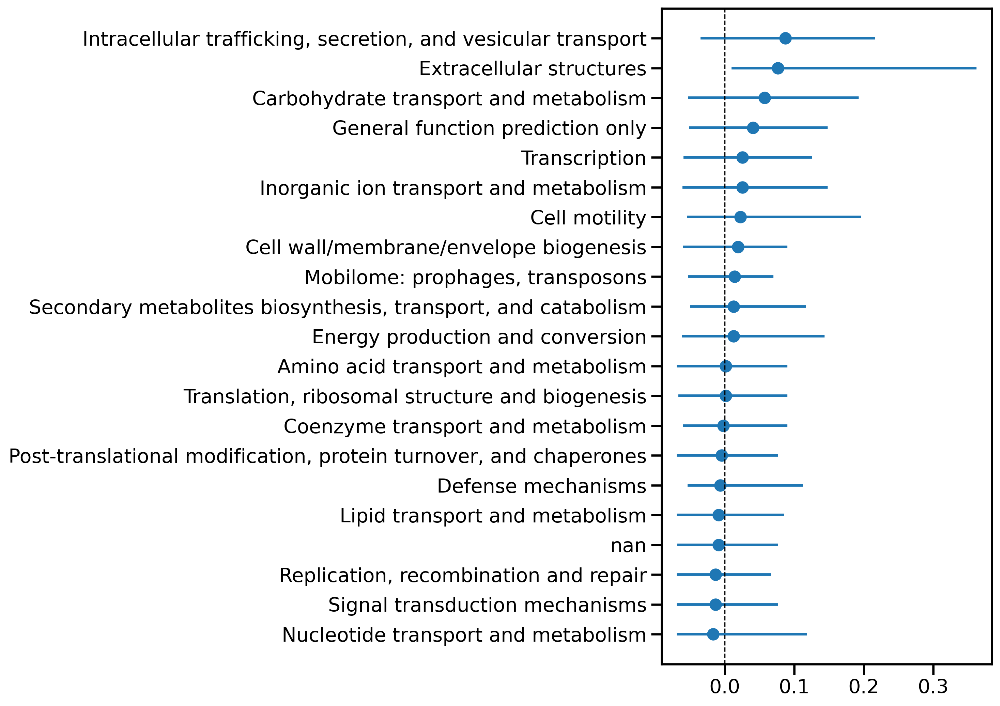

In [467]:
d2 = d1.assign(y=range(d1.shape[0]))

fig, ax = plt.subplots(figsize=(5, 10))
ax.hlines(d2.y, d2[0.25], d2[0.75])
ax.scatter(d2[0.5], d2.y)
ax.set_yticks(d2.y)
ax.set_yticklabels(d2.description)
ax.axvline(0, linestyle='--', color='k', lw=1)

In [457]:
cog_category

,description
category,
D,"Cell cycle control, cell division, chromosome ..."
M,Cell wall/membrane/envelope biogenesis
N,Cell motility
O,"Post-translational modification, protein turno..."
T,Signal transduction mechanisms
U,"Intracellular trafficking, secretion, and vesi..."
V,Defense mechanisms
W,Extracellular structures
Y,Nuclear structure


In [471]:
d0[(d0.moderate_hit_fraction_of_strains > 0.25) & (d0.moderate_hit_fraction_of_strains < 0.75)].sort_values('genetic_conservation_score')

,moderate_hit_fraction_of_strains,genetic_conservation_score,ftype,length_bp,gene,ec_number,cog,product,category
9165,0.3750,-0.104291,CDS,318,NaN,NaN,NaN,hypothetical protein,none
7887,0.4375,-0.103701,CDS,171,NaN,NaN,NaN,hypothetical protein,none
5917,0.3750,-0.103254,CDS,195,NaN,NaN,NaN,hypothetical protein,none
11384,0.3750,-0.102261,CDS,180,NaN,NaN,NaN,hypothetical protein,none
7843,0.6875,-0.101498,CDS,1923,dgcQ,2.7.7.65,NaN,putative diguanylate cyclase DgcQ,none
...,...,...,...,...,...,...,...,...,...
8357,0.5000,0.862620,CDS,1065,NaN,NaN,NaN,hypothetical protein,none
8344,0.6250,0.862620,CDS,1038,NaN,NaN,NaN,hypothetical protein,none
5561,0.5625,0.862620,CDS,3198,NaN,NaN,NaN,hypothetical protein,none
8774,0.5625,0.862620,CDS,1317,NaN,NaN,NaN,hypothetical protein,none


In [481]:
(sample_meta.loc[species_depth.index].subject_id.value_counts() > 5).sum()

103

In [492]:
from glob import glob
gene75_counts = {}
for path in tqdm(glob('ref_temp/midasdb_uhgg/pangenomes/*/cluster_info.txt')):
    species_id = path[len('ref_temp/midasdb_uhgg/pangenomes/'):-len('/cluster_info.txt')]
    gene75_counts[species_id] = pd.read_table(path).centroid_75.unique().shape[0]

  5%|██▏                                      | 31/584 [00:02<00:53, 10.25it/s]/tmp/bsmith/ipykernel_46443/3490170954.py:5: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  gene75_counts[species_id] = pd.read_table(path).centroid_75.unique().shape[0]
 25%|██████████▏                             | 148/584 [00:12<00:25, 17.18it/s]/tmp/bsmith/ipykernel_46443/3490170954.py:5: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  gene75_counts[species_id] = pd.read_table(path).centroid_75.unique().shape[0]
100%|████████████████████████████████████████| 584/584 [00:50<00:00, 11.63it/s]


Text(0.5, 0, 'Number of Genomes')

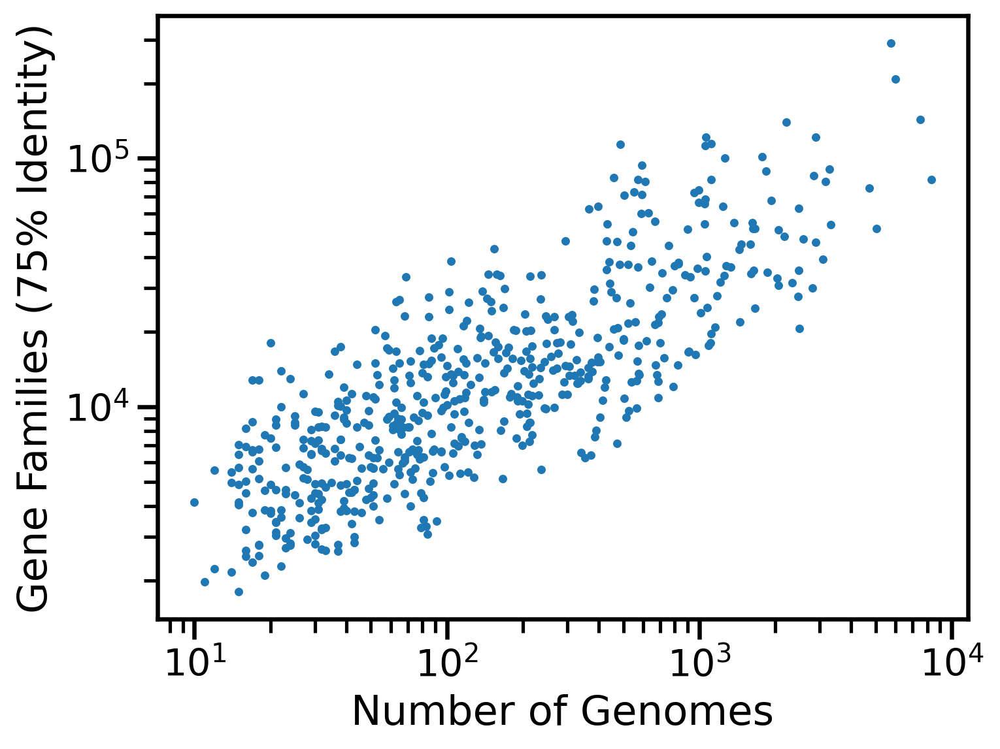

In [511]:
d = midasdb_uhgg_meta.assign(species_id=lambda x: x.species_id.astype(str)).set_index('species_id').assign(gene75_counts=pd.Series(gene75_counts))
plt.scatter('genome_counts', 'gene75_counts', data=d, s=5)
plt.yscale('log')
plt.xscale('log')
plt.ylabel('Gene Families (75% Identity)')
plt.xlabel('Number of Genomes')

/pollard/home/bsmith/Projects/strain-corr/lib/plot.py:29: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  labels = pd.Series(x).unique()
/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/umap/umap_.py:1780: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


Text(0.5, 1.0, 'Escherichia coli')

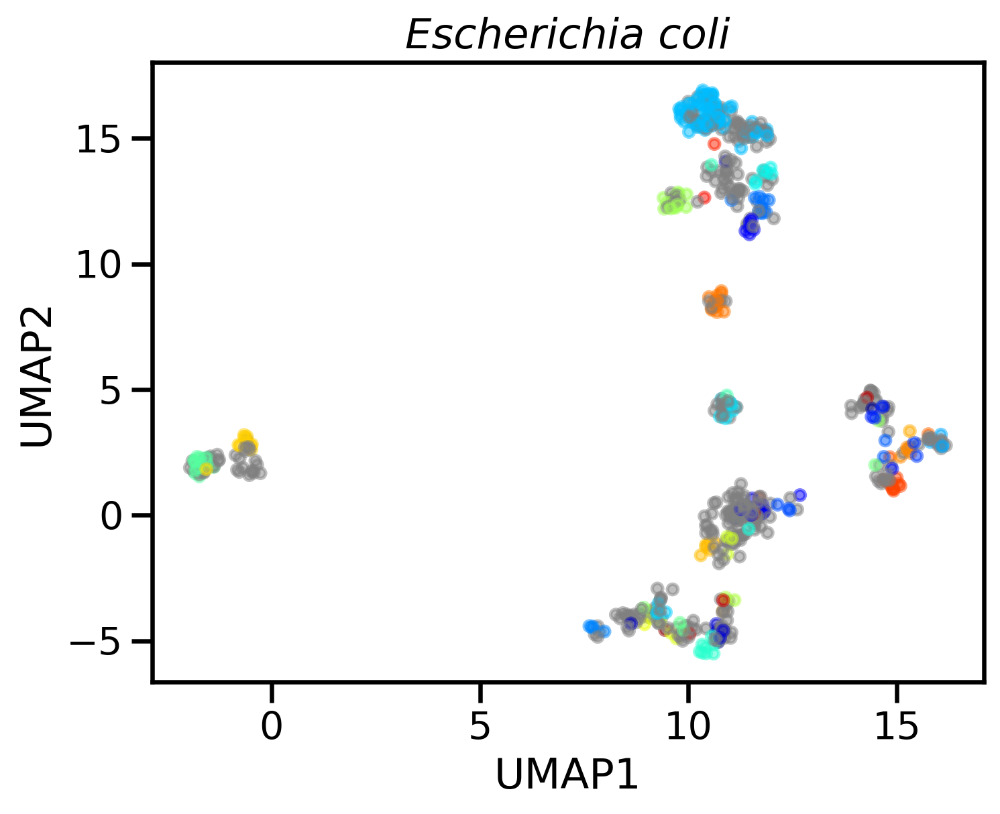

In [554]:
np.random.seed(0)

species_id = '102506'
path = f'data/sp-{species_id}.hmp2.a.r.proc.gtpro.filt-poly05-cvrg05.mgen.pdist.nc'
d0 = xr.load_dataarray(path).to_series().unstack().rename_axis(index='sample', columns='sample')

all_strain_palette = lib.plot.construct_ordered_palette(strain_meta.sample(frac=1).index, 'jet')
high_power_strain_palette = lib.plot.construct_ordered_palette([], extend={s: all_strain_palette[s] for s in high_power_strain_list})


d1 = (
    pd.DataFrame(
        UMAP(n_neighbors=30, metric='precomputed', random_state=0)
        .fit_transform(d0),
        columns=['PC1', 'PC2'],
        index=d0.index,
    )
    .assign(
        c_all=lambda x: x.index.to_series().map(sample_to_strain).map(all_strain_palette),
        c_high_power=lambda x: x.index.to_series().map(sample_to_strain).map(high_power_strain_palette),
        pc1=lambda x: jitter(x.PC1, width=x.PC1.std() / 10),
        pc2=lambda x: jitter(x.PC2, width=x.PC2.std() / 10),
    )
)

fig, ax = plt.subplots(
    # figsize=(15, 10),
)
ax.scatter(
    'pc1',
    'pc2',
    data=d1,
    c='c_all',
    s=20,
    alpha=0.5,
)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('Escherichia coli', fontdict=dict(fontstyle='italic'))

Text(0.5, 1.0, 'Escherichia coli')

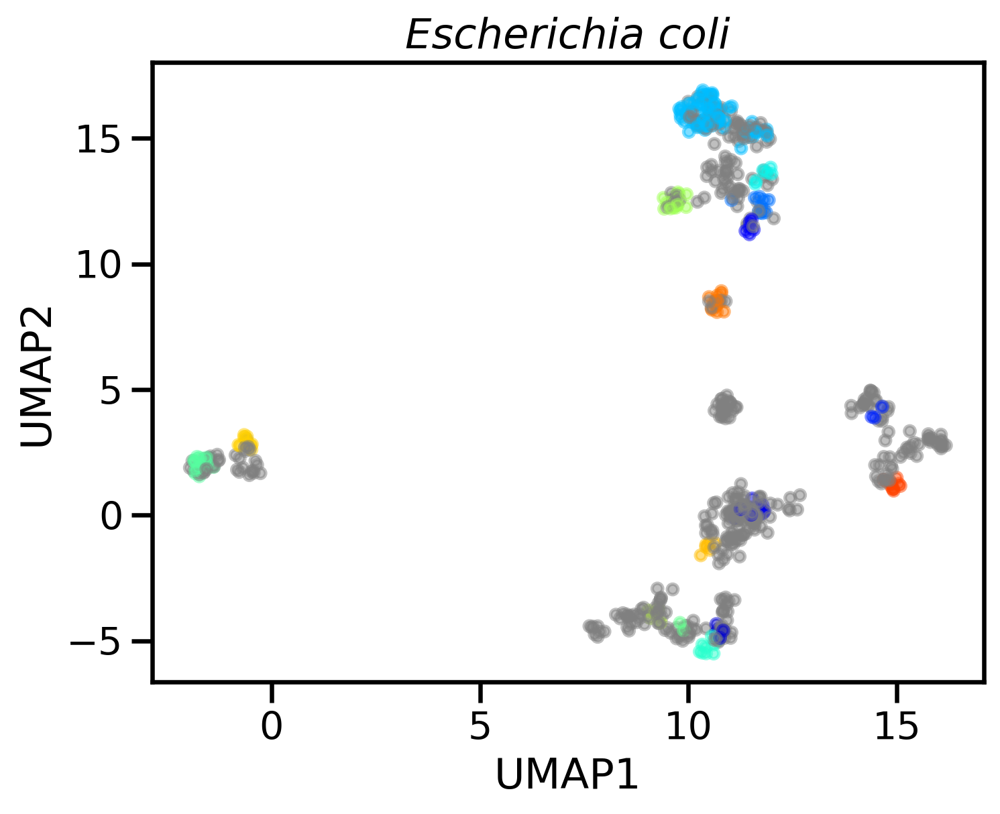

In [555]:
fig, ax = plt.subplots(
    # figsize=(15, 10),
)
ax.scatter(
    'pc1',
    'pc2',
    data=d1,
    c='c_high_power',
    s=20,
    alpha=0.5,
)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('Escherichia coli', fontdict=dict(fontstyle='italic'))

/pollard/home/bsmith/Projects/strain-corr/lib/plot.py:29: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  labels = pd.Series(x).unique()
/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/umap/umap_.py:1780: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")


Text(0.5, 1.0, 'Escherichia coli')

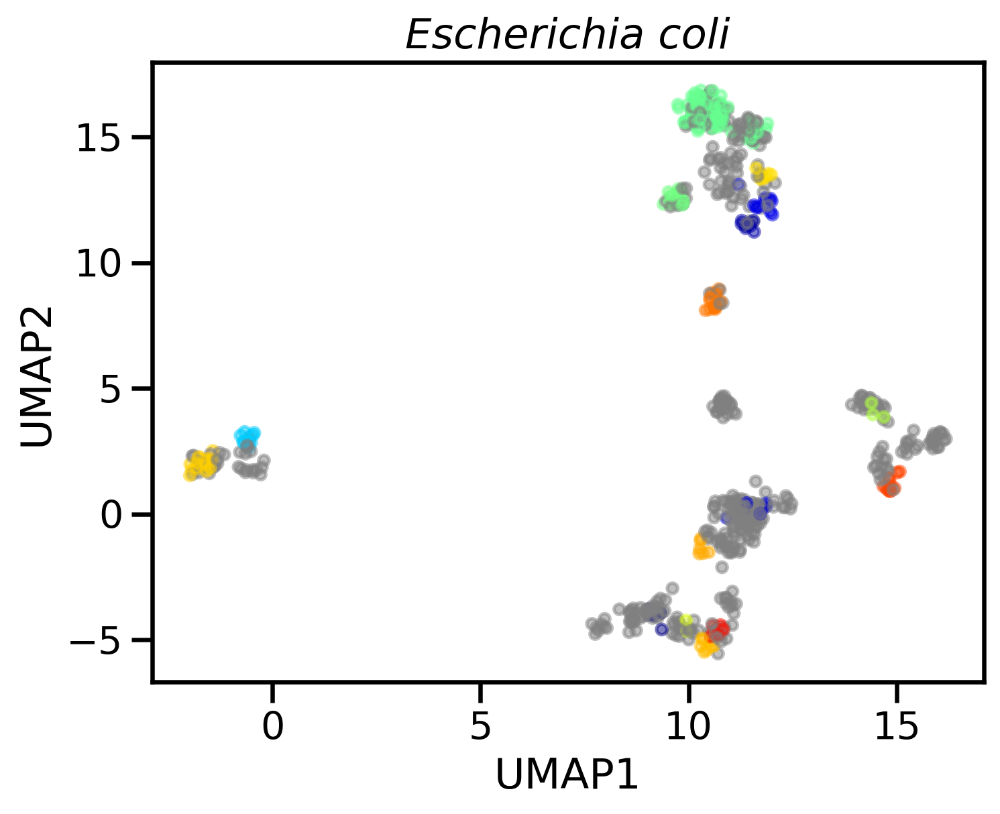

In [552]:
np.random.seed(0)

high_power_strain_palette = lib.plot.construct_ordered_palette([], extend={s: all_strain_palette[s] for s in high_power_strain_list})
d2 = d1.assign(        c=lambda x: x.index.to_series().map(sample_to_strain).map(palette),



fig, ax = plt.subplots(
    # figsize=(15, 10),
)
ax.scatter(
    'pc1',
    'pc2',
    data=d1,
    c='c',
    s=20,
    alpha=0.5,
)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title('Escherichia coli', fontdict=dict(fontstyle='italic'))

In [723]:
species_id = '102506'

fit_geno = sf.data.World.load(f'data_temp/sp-{species_id}.hmp2.a.r.proc.gtpro.filt-poly05-cvrg05.ss-g10000-block0-seed0.fit-sfacts37-s80-seed0.world.nc').genotype
ref_geno = sf.data.Metagenotype.load(f'data/sp-{species_id}.gtpro_ref.mgen.nc').sel(position=fit_genotype.position).to_estimated_genotype()

In [724]:
%%time

mgtp_ref_cdist = pd.DataFrame(sf.math.genotype_cdist(fit_geno.values, ref_geno.values), index=fit_geno.strain, columns=ref_geno.strain)

strain
1     0.326842
3     0.268956
6     0.347665
7     0.288260
8     0.243317
10    0.378290
16    0.312449
22    0.266460
27    0.376877
34    0.278256
36    0.382953
39    0.448218
53    0.321959
57    0.283098
67    0.355945
85    0.254329
dtype: float64

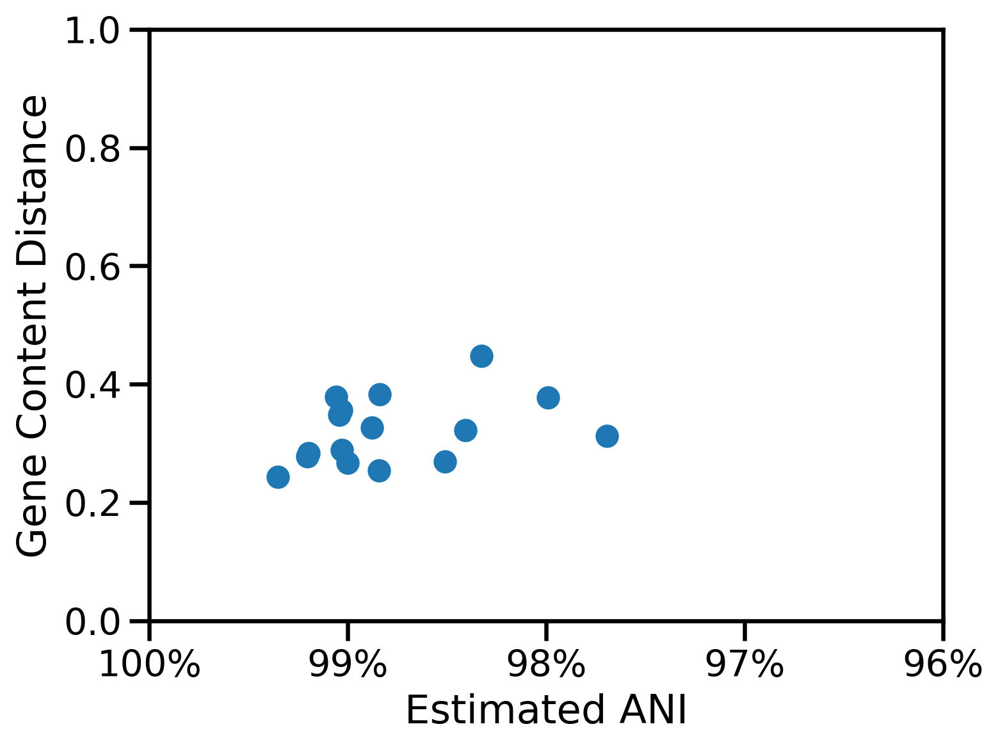

In [799]:
d = pd.DataFrame(dict(y=jac_cdist_inf[high_power_strain_list].min(), x=1 - (0.078 * mgtp_ref_cdist.loc[high_power_strain_list].min(1))))

plt.scatter(x='x', y='y', data=d)
plt.xlabel('Estimated ANI')
plt.ylabel('Gene Content Distance')
plt.ylim(0, 1.0)
plt.xlim(0.96, 1.0)
ax = plt.gca()
ax.xaxis.set_inverted(True)
ax.xaxis.set_major_formatter(mpl.ticker.PercentFormatter(1, decimals=0))

# plt.hist(mgtp_ref_cdist.loc[high_power_strain_list].min(1), bins=8)
# None

In [770]:
strain_list = high_power_strain_list
this_cog_category = 'C'
# cog_list = cog_x_category[cog_x_category.category == this_cog_category].cog.unique()
gene_list = list(
    # set(idxwhere(gene_meta.cog.isin(cog_list)))
    set(idxwhere(high_confidence_hit[strain_list].mean(1) > 0.05))
)
guide_gene = 'UHGG004518_00665'
# gene_list = idxwhere(high_confidence_hit[strain_list].mean(1) > 0.05)

x = moderate_hit.astype(float).loc[gene_list, strain_list]

_gene_cluster_list = idxwhere(
    pd.DataFrame(sp.spatial.distance.squareform(sp.spatial.distance.pdist(x, metric='cosine')), index=x.index, columns=x.index)
    .loc[guide_gene].sort_values() < 0.1
)
print(len(_gene_cluster_list))

x_gene_cluster_list = _gene_cluster_list  # FIXME

gene_meta.join(cog_meta, on='cog', rsuffix='_cog_name').loc[_gene_cluster_list][['gene', 'ec_number', 'cog', 'product', 'description', 'gene_cog_name', 'pathway']].sort_values('gene')

26


,gene,ec_number,cog,product,description,gene_cog_name,pathway
gene_id,,,,,,,
UHGG141799_04642,fdtC,2.3.1.197,NaN,"dTDP-3-amino-3,6-dideoxy-alpha-D-galactopyrano...",NaN,NaN,NaN
UHGG013542_02000,intA_1,NaN,COG0582,Prophage integrase IntA,"Integrase/recombinase, includes phage integrase",FimB,NaN
UHGG004518_00653,kpsD,NaN,COG1596,Polysialic acid transport protein KpsD,Periplasmic protein Wza involved in polysaccha...,Wza,NaN
UHGG004518_00654,kpsM,NaN,COG1682,Polysialic acid transport protein KpsM,ABC-type polysaccharide/teichoic acid/polyol p...,TagG,NaN
UHGG004518_00664,rfbB_1,4.2.1.46,COG1088,"dTDP-glucose 4,6-dehydratase","dTDP-D-glucose 4,6-dehydratase",RfbB,NaN
UHGG004518_00667,rfbC_1,5.1.3.13,COG1898,"dTDP-4-dehydrorhamnose 3,5-epimerase","dTDP-4-dehydrorhamnose 3,5-epimerase or relate...",RfbC,NaN
UHGG004518_00665,rfbD_1,1.1.1.133,COG1091,dTDP-4-dehydrorhamnose reductase,dTDP-4-dehydrorhamnose reductase,RfbD,NaN
UHGG004518_00666,rmlA,2.7.7.24,COG1209,Glucose-1-phosphate thymidylyltransferase,dTDP-glucose pyrophosphorylase,RmlA1,NaN
UHGG145503_05149,NaN,NaN,NaN,hypothetical protein,NaN,NaN,NaN


In [772]:
gene_meta.join(cog_meta, on='cog', rsuffix='_cog_name').loc[_gene_cluster_list][['gene', 'ec_number', 'cog', 'product', 'description', 'gene_cog_name', 'pathway']].sort_values('gene')['product'].value_counts()

hypothetical protein                                                      18
dTDP-3-amino-3,6-dideoxy-alpha-D-galactopyranose 3-N-acetyltransferase     1
Prophage integrase IntA                                                    1
Polysialic acid transport protein KpsD                                     1
Polysialic acid transport protein KpsM                                     1
dTDP-glucose 4,6-dehydratase                                               1
dTDP-4-dehydrorhamnose 3,5-epimerase                                       1
dTDP-4-dehydrorhamnose reductase                                           1
Glucose-1-phosphate thymidylyltransferase                                  1
Name: product, dtype: int64

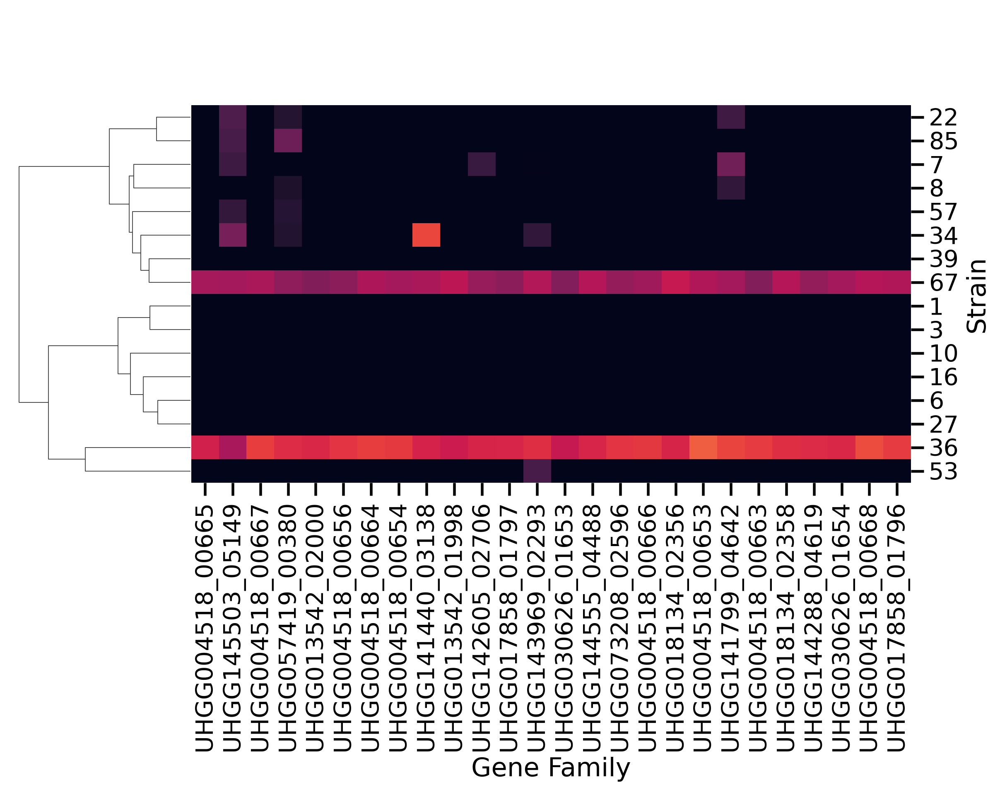

In [776]:
strain_list = high_power_strain_list
gene_list = x_gene_cluster_list

x = strain_depth.astype(float).loc[gene_list, strain_list]

if len(gene_list) < 2e4:
    cg = sns.clustermap(
        x.T,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=1,
        xticklabels=1,
        figsize=(10, 8),
        col_cluster=False,
        row_linkage=fit.genotype.sel(strain=strain_list).linkage("strain"),
        cbar_pos=None,  #(0.05, 0.95, 0.2, 0.05),
    )
    cg.ax_heatmap.set_xlabel('Gene Family')
    cg.ax_heatmap.set_ylabel('Strain')
else:
    print("Too many genes for clustermap:", len(gene_list))

12381


/pollard/home/bsmith/.snakemake/conda/f8a6987d3ee0b7a0d4e1448c378762e7/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


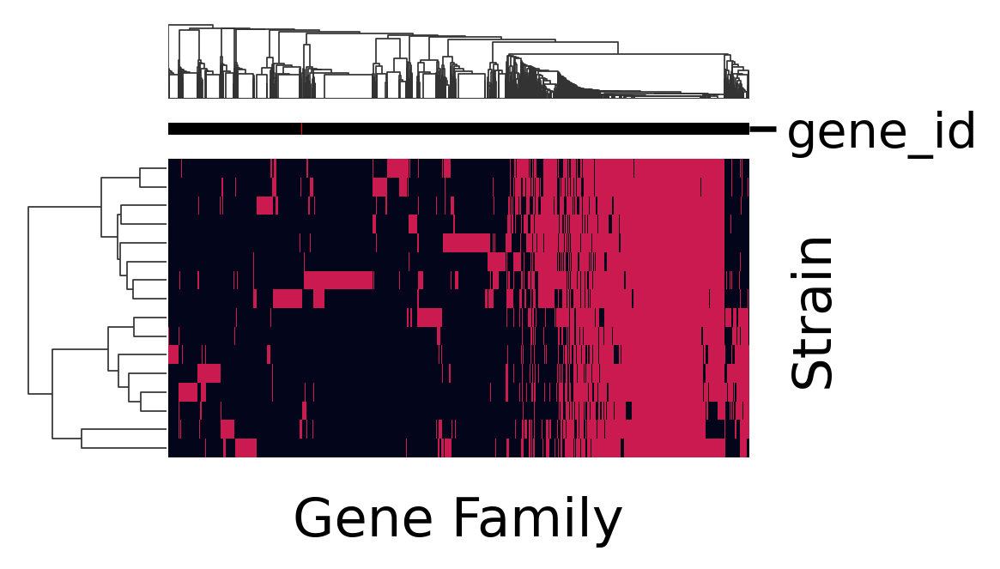

In [764]:
strain_list = high_power_strain_list
genes_list = idxwhere(high_confidence_hit[strain_list].sum(1) > 0)
d = moderate_hit.astype(float).loc[genes_list, strain_list]
print(d.shape[0])

if len(genes_list) < 3e4:
    cg = sns.clustermap(
        d.T,
        metric='cosine',
        norm=mpl.colors.SymLogNorm(linthresh=1e-4, vmin=0.1, vmax=10),
        yticklabels=0,
        xticklabels=0,
        row_linkage=fit.genotype.sel(strain=strain_list).linkage("strain"),
        cbar_kws=dict(orientation='horizontal', visible=False),
        cbar_pos=None,  #(0.05, 0.95, 0.2, 0.05),
        figsize=(5, 3),
        col_colors=d.index.to_series().isin(x_gene_cluster_list).map({True: 'red', False: 'black'}),
    )
    cg.ax_heatmap.set_xlabel('Gene Family')
    cg.ax_heatmap.set_ylabel('Strain')
else:
    print("Too many genes for clustermap:", len(genes_list))